In [1]:
%load_ext autoreload
%autoreload 2

# Trade Strategy 20250603

## Description
Combine various individual strategies and assets to create a portfolio.

## Libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from utils.data_fetcher import TickerPriceDataFetcher
import os
from indicators.volatility import calculate_atr, calculate_forward_vol
from indicators.returns import calculate_returns, calculate_forward_returns, calculate_MA_returns, calculate_relative_volume
from utils.helpers import PercentileScaler
import datetime
from sklearn.linear_model import LinearRegression
from utils.backtester import BackTester
import backtrader as bt
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from pypfopt.hierarchical_portfolio import HRPOpt
from pypfopt.plotting import plot_dendrogram
from pypfopt import risk_models
from scipy import stats
import statsmodels.api as sm
from utils.helpers import constrained_linear_regression, gmean, hmean, compute_r2, normalize_weights



Warning - Certain functionality 
             requires requests_html, which is not installed.
             
             Install using: 
             pip install requests_html
             
             After installation, you may have to restart your Python session.


c:\Users\alexr\AlgoTester\utils\data_fetcher.py:19: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


KeyboardInterrupt: 

## Utils

## Parameters

In [ ]:
LOOKFORWARD_PERIOD = 21
REBALANCE_PERIOD = 21
LOOKBACK_PERIODS=[21, 100, 252]
LAG_PERIODS = [0, 21]


COVAR_LOOKBACK_PERIOD = 252
HISTORY_LOOKBACK_PERIOD = 252 * 2

CURRENT_DATE = datetime.datetime.now().date()
CURRENT_DATE = CURRENT_DATE.strftime("%Y%m%d")

tickers_to_fetch = [
    'SHV', 
    'SPY', 
    'TLT', 
    'GLD',
    'USO',
    'DBA',
    'PPLT',
    'DBB',
    'EEM',
    'LQD',
    'UPRO',
    'TMF',
    'URA'
    
]

## Load Data

In [ ]:
fetcher = TickerPriceDataFetcher()
price_data = fetcher.load_data(ticker_list=tickers_to_fetch)

for ticker in price_data:
    print(ticker, price_data[ticker].index.to_list()[0], price_data[ticker].index.to_list()[-1])
    # display(price_data[ticker])


2025-08-23 20:42:42,357 - utils.data_fetcher - INFO - Loading data for ['SHV', 'SPY', 'TLT', 'GLD', 'USO', 'DBA', 'PPLT', 'DBB', 'EEM', 'LQD', 'UPRO', 'TMF', 'URA']
2025-08-23 20:42:42,359 - utils.data_fetcher - INFO - Data for SHV already exists
2025-08-23 20:42:42,361 - utils.data_fetcher - INFO - Data for SPY already exists
2025-08-23 20:42:42,363 - utils.data_fetcher - INFO - Data for TLT already exists
2025-08-23 20:42:42,364 - utils.data_fetcher - INFO - Data for GLD already exists
2025-08-23 20:42:42,366 - utils.data_fetcher - INFO - Data for USO already exists
2025-08-23 20:42:42,368 - utils.data_fetcher - INFO - Data for DBA already exists
2025-08-23 20:42:42,370 - utils.data_fetcher - INFO - Data for PPLT already exists
2025-08-23 20:42:42,372 - utils.data_fetcher - INFO - Data for DBB already exists
2025-08-23 20:42:42,373 - utils.data_fetcher - INFO - Data for EEM already exists
2025-08-23 20:42:42,375 - utils.data_fetcher - INFO - Data for LQD already exists
2025-08-23 20:

SHV 2007-01-11 00:00:00 2025-08-22 00:00:00
SPY 1993-01-29 00:00:00 2025-08-22 00:00:00
TLT 2002-07-30 00:00:00 2025-08-22 00:00:00
GLD 2004-11-18 00:00:00 2025-08-22 00:00:00
USO 2006-04-10 00:00:00 2025-08-22 00:00:00
DBA 2007-01-05 00:00:00 2025-08-22 00:00:00
PPLT 2010-01-08 00:00:00 2025-08-22 00:00:00
DBB 2007-01-05 00:00:00 2025-08-22 00:00:00
EEM 2003-04-14 00:00:00 2025-08-22 00:00:00
LQD 2002-07-30 00:00:00 2025-08-22 00:00:00
UPRO 2009-06-25 00:00:00 2025-08-22 00:00:00
TMF 2009-04-16 00:00:00 2025-08-22 00:00:00
URA 2010-11-05 00:00:00 2025-08-22 00:00:00


## Define functions
### Momentum Signal and Returns

In [ ]:
def get_momentum_signal(df, lookback_period, lag_period, pos_signal=1, neg_signal=-1, neutral_signal=0):
    """
    Generate a momentum trading signal.
    
    Parameters
    ----------
    df : pd.DataFrame
        Must contain 'close' column.
    lookback_period : int
        Number of days for momentum lookback.
    lag_period : int
        Number of days to lag momentum signal.
    pos_signal, neg_signal, neutral_signal : int or float
        Values assigned to positive, negative, and neutral signals.
        
    Returns
    -------
    pd.Series
        Trading signal aligned with df.index.
    """
    df = df[['close']].copy()
    
    # Momentum = percentage change over lookback period
    df['momentum'] = df['close'].pct_change(lookback_period)
    
    # Lag to avoid lookahead bias
    df['lagged_momentum'] = df['momentum'].shift(lag_period)
    
    # Generate signals
    df['signal'] = np.where(df['lagged_momentum'] > 0, pos_signal, neg_signal)
    df['signal'] = df['signal'].fillna(neutral_signal)
    
    # Shift once more so signal is used *next day*
    df['signal'] = df['signal'].shift(1).fillna(neutral_signal)
    
    return df['signal']


def get_momentum_returns(
        df, 
        lookback_period, 
        lag_period, 
        pos_signal=1,
        neg_signal=-1,
        rebalance_period=21, 
        interest_rate=0.03
        ):
    """
    Backtest momentum strategy with periodic rebalancing.
    
    Parameters
    ----------
    df : pd.DataFrame
        Must contain 'close' column.
    lookback_period : int
        Lookback window for momentum.
    lag_period : int
        Lag period for momentum signal.
    pos_signal, neg_signal : int or float
        Long/short signal values.
    rebalance_period : int
        Days between rebalancing trades.
    interest_rate : float
        Annualized risk-free interest rate.
        
    Returns
    -------
    pd.DataFrame
        DataFrame with market returns, signals, positions, strategy returns, and cumulative returns.
    """
    df = df.copy()
    
    # Daily market returns
    df['market_returns'] = df['close'].pct_change()
    df['market_returns'] = df['market_returns'].fillna(0.0)
    df['market_cumulative_returns'] = (1 + df['market_returns']).cumprod()
    
    # Get signals
    df['signal'] = get_momentum_signal(df, lookback_period, lag_period,
                                       pos_signal=pos_signal, neg_signal=neg_signal)
    
    # Rebalance positions
    rebalance_flags = (np.arange(len(df)) % rebalance_period == 0)
    df['position'] = df['signal'].where(rebalance_flags).ffill().fillna(0)
    
    # Daily risk-free rate
    rf_daily = (1 + interest_rate)**(1/252) - 1
    
    # Strategy returns: weighted combination of risky asset and cash
    df['strategy_returns'] = df['market_returns'] * df['position'] \
                             + rf_daily * (1 - df['position'].abs())
    
    df['strategy_returns'] = df['strategy_returns'].fillna(0.0)
    
    # Cumulative returns
    df['cumulative_returns'] = (1 + df['strategy_returns']).cumprod()
    
    return df[['market_returns', 'signal', 'position', 'strategy_returns', 'cumulative_returns', 'market_cumulative_returns']]


### Plotting

In [ ]:
import matplotlib.pyplot as plt

def plot_momentum_backtests(ticker, lookback_list, lag_list, pos_list, neg_list, rebalance_period=21, interest_rate=0.03):
    """
    Plot cumulative and rolling 1-year returns for momentum strategies with different parameters,
    including market buy-and-hold benchmark.
    
    Parameters
    ----------
    ticker : str
        Ticker symbol (must exist in price_data).
    lookback_list, lag_list, pos_list, neg_list : list
        Lists of parameter values to test.
    rebalance_period : int
        Rebalance frequency in days.
    interest_rate : float
        Annualized risk-free interest rate.
    """
    
    df = price_data[ticker].copy()
    df = df.sort_index()  # Ensure sorted by date
    
    results = {}
    
    # Compute buy-and-hold benchmark
    df['market_returns'] = df['close'].pct_change().fillna(0)
    df['market_cum'] = (1 + df['market_returns']).cumprod()
    df['market_roll_1y'] = (1 + df['market_returns']).rolling(252).apply(np.prod, raw=True) - 1
    results['Buy & Hold'] = df[['market_returns', 'market_cum', 'market_roll_1y']]
    
    # Compute momentum strategies
    for lookback in lookback_list:
        for lag in lag_list:
            for pos_signal in pos_list:
                for neg_signal in neg_list:
                    label = f"L{lookback}-Lag{lag}-Pos{pos_signal}-Neg{neg_signal}"
                    strat_df = get_momentum_returns(
                        df=df,
                        lookback_period=lookback,
                        lag_period=lag,
                        pos_signal=pos_signal,
                        neg_signal=neg_signal,
                        rebalance_period=rebalance_period,
                        interest_rate=interest_rate
                    )
                    
                    # Store cumulative + rolling 1yr returns
                    strat_df['rolling_1y'] = (1 + strat_df['strategy_returns']).rolling(252).apply(np.prod, raw=True) - 1
                    results[label] = strat_df
    
    # --- Plot cumulative returns ---
    plt.figure(figsize=(12,6))
    for label, strat_df in results.items():
        if label == "Buy & Hold":
            plt.plot(df.index, strat_df['market_cum'], label=label, linewidth=2.5, color="black")
        else:
            plt.plot(strat_df.index, strat_df['cumulative_returns'], label=label, alpha=0.7)
    
    plt.yscale('log')
    plt.title(f"{ticker} - Cumulative Returns (Momentum vs Buy & Hold)")
    plt.xlabel("Date")
    plt.ylabel("Cumulative Returns (log scale)")
    plt.legend()
    plt.grid(True, which="both", ls="--", alpha=0.6)
    plt.show()
    
    # --- Plot rolling 1-year returns ---
    plt.figure(figsize=(12,6))
    for label, strat_df in results.items():
        if label == "Buy & Hold":
            plt.plot(df.index, strat_df['market_roll_1y'] + 1, label=label, linewidth=2.5, color="black")
        else:
            plt.plot(strat_df.index, strat_df['rolling_1y'] + 1, label=label, alpha=0.7)
    
    plt.yscale('log')
    plt.title(f"{ticker} - Rolling 1-Year Returns (Momentum vs Buy & Hold)")
    plt.xlabel("Date")
    plt.ylabel("1Y Rolling Returns (log scale)")
    plt.legend()
    plt.grid(True, which="both", ls="--", alpha=0.6)
    plt.show()


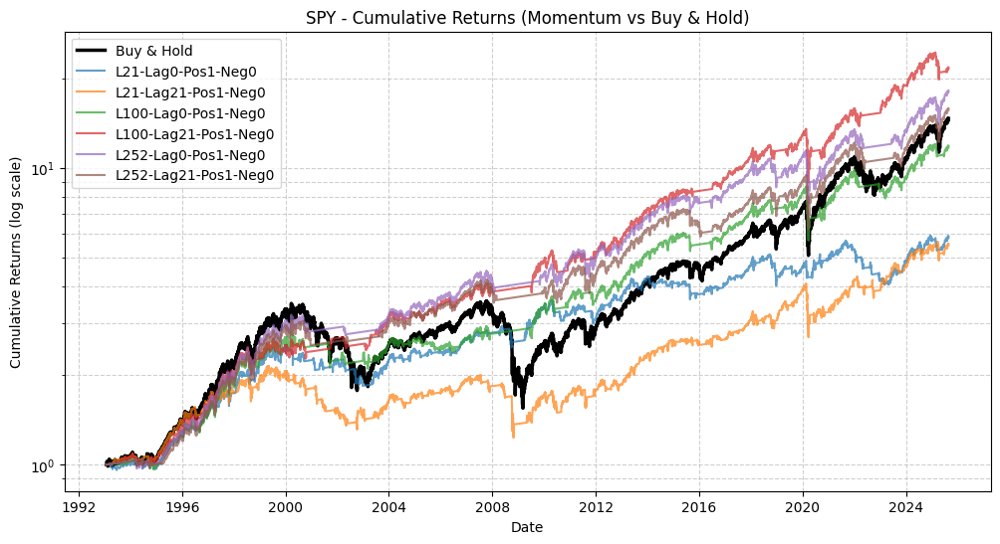

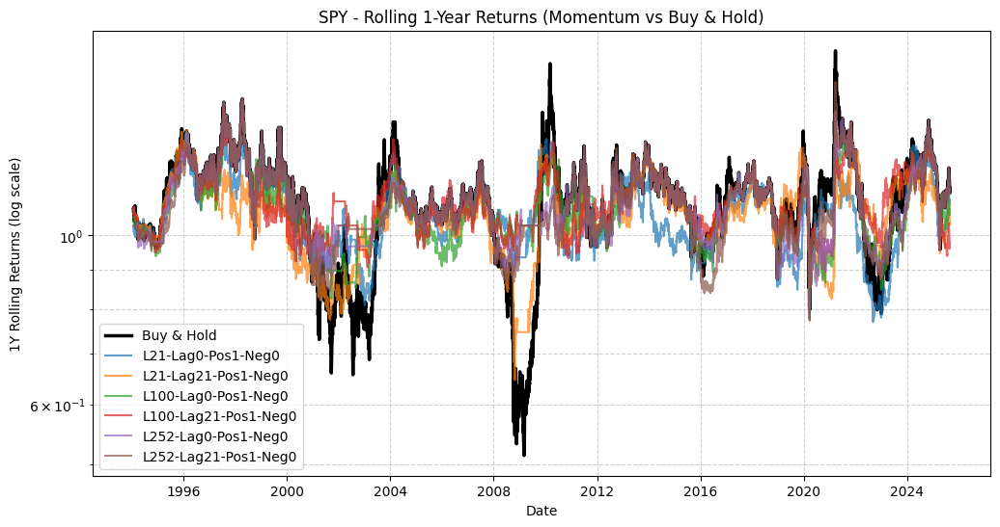

-----------------------------------------


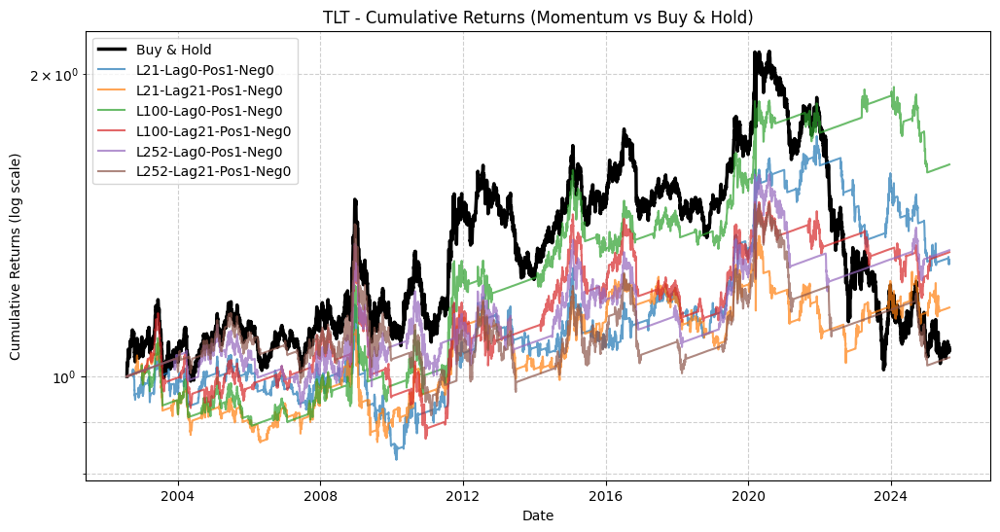

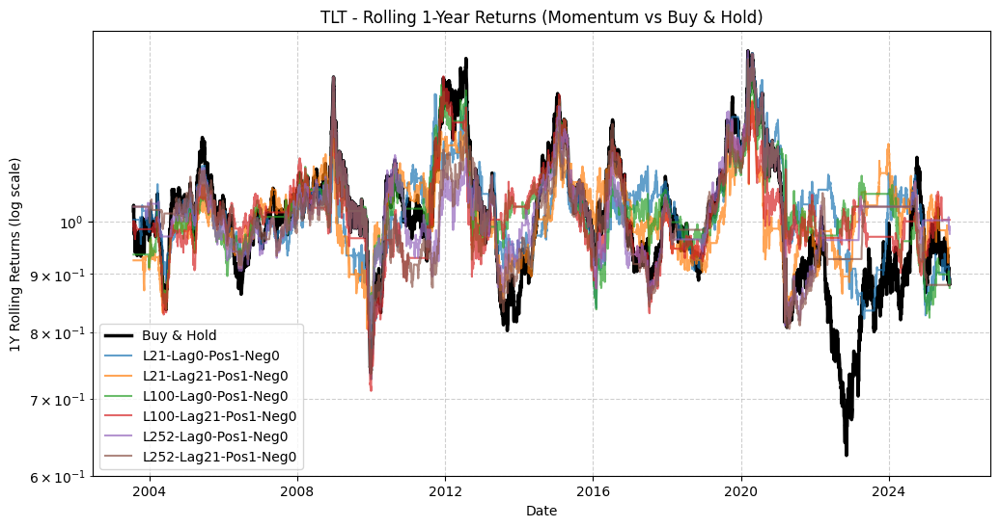

-----------------------------------------


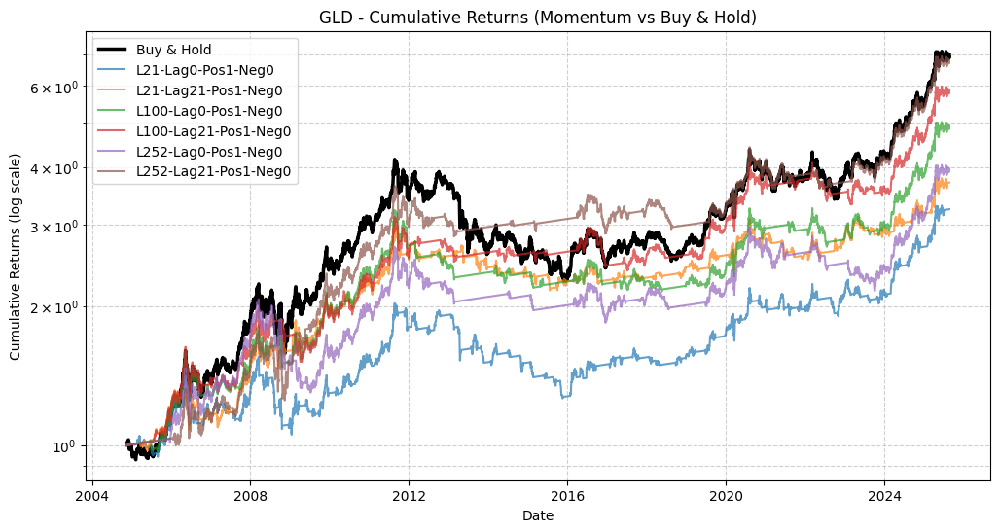

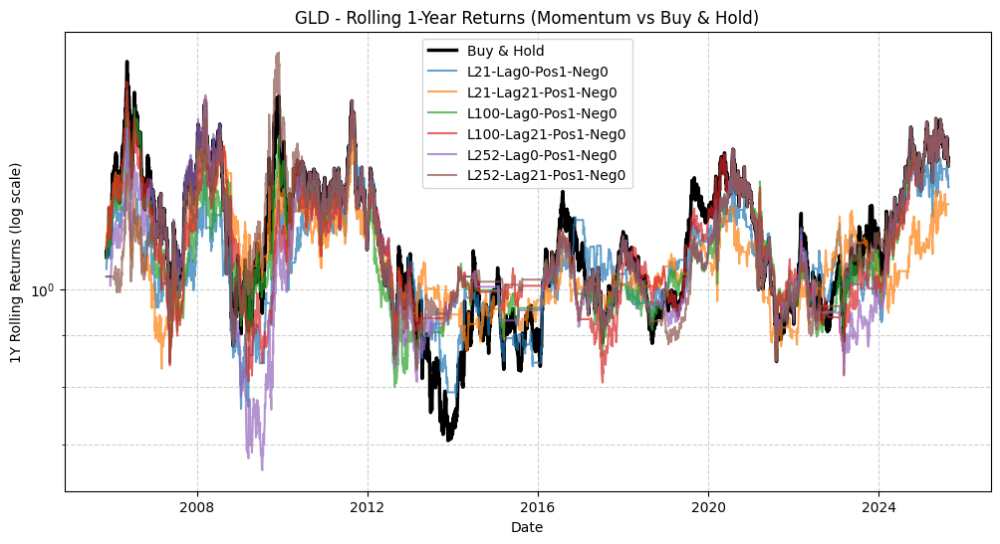

-----------------------------------------


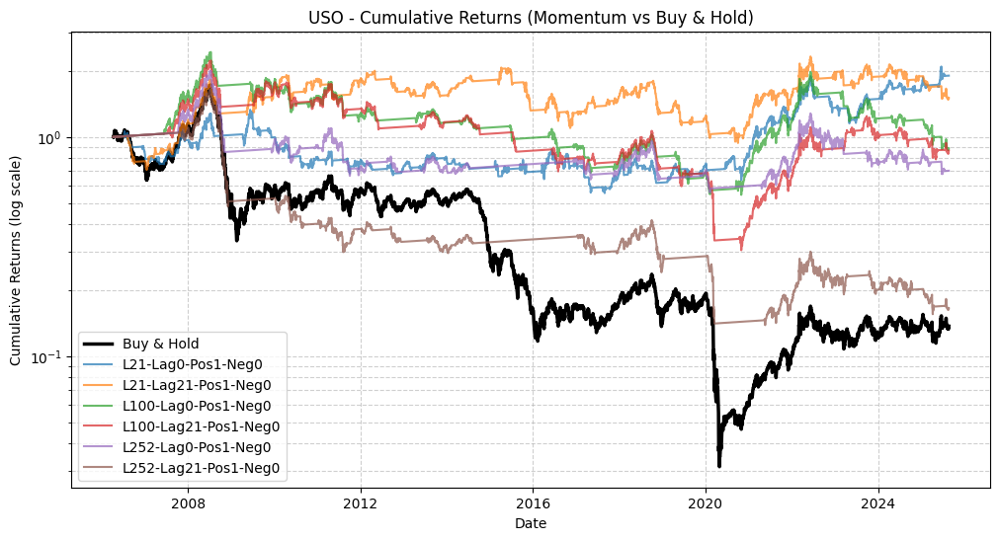

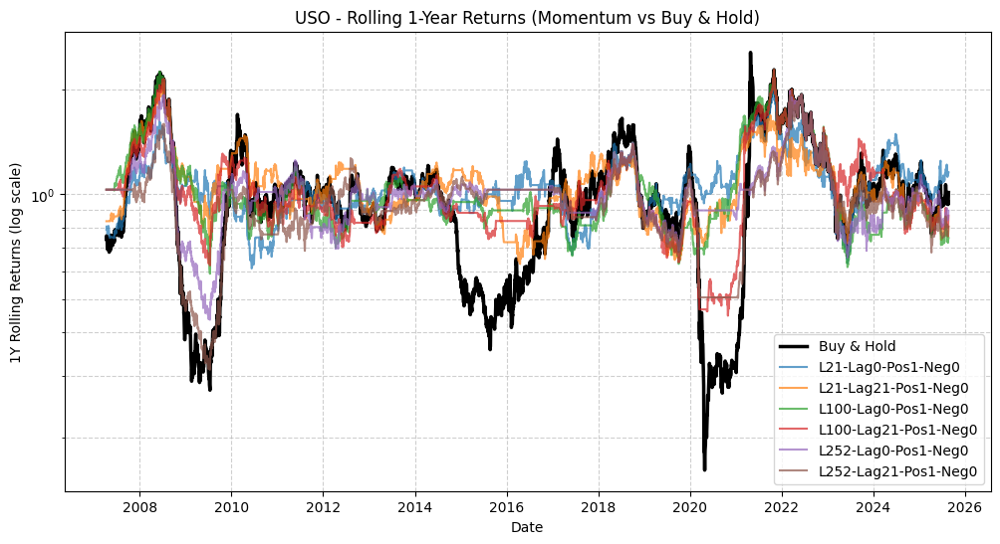

-----------------------------------------


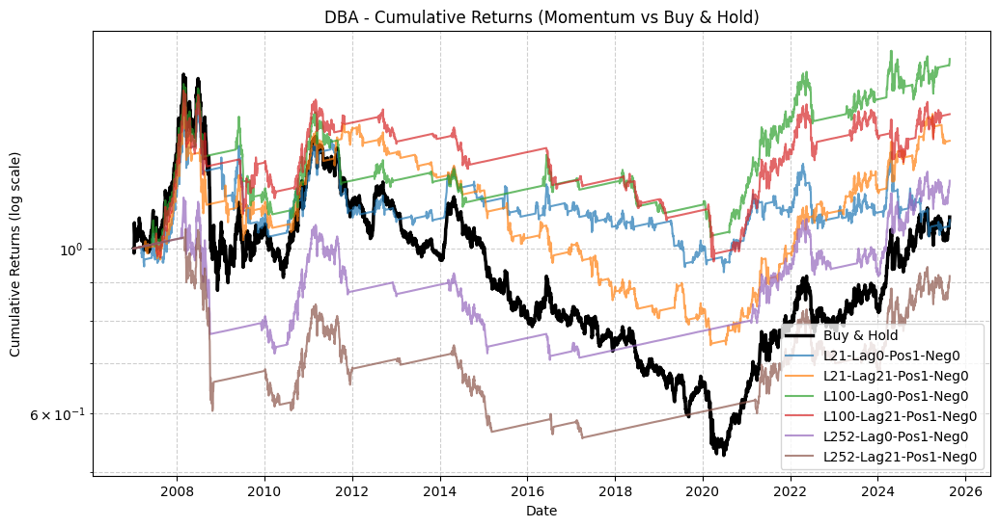

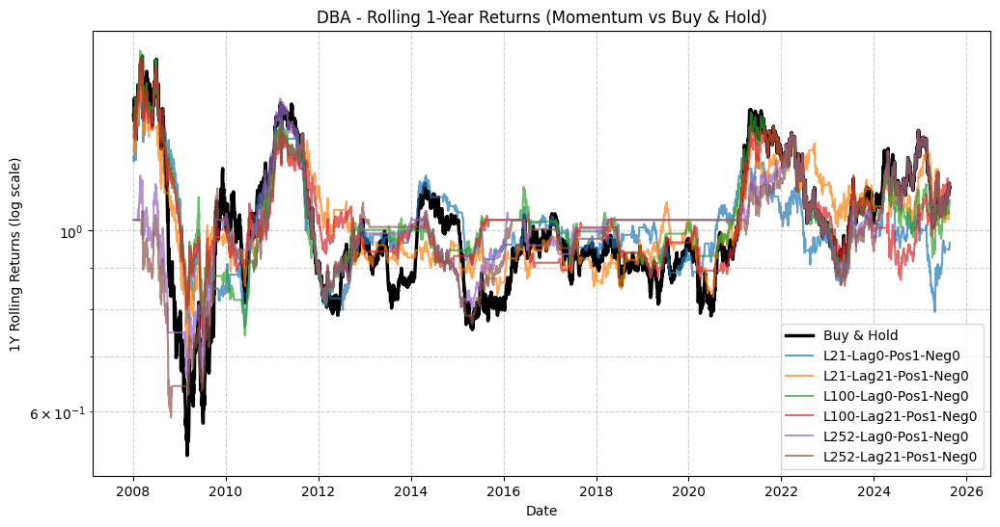

-----------------------------------------


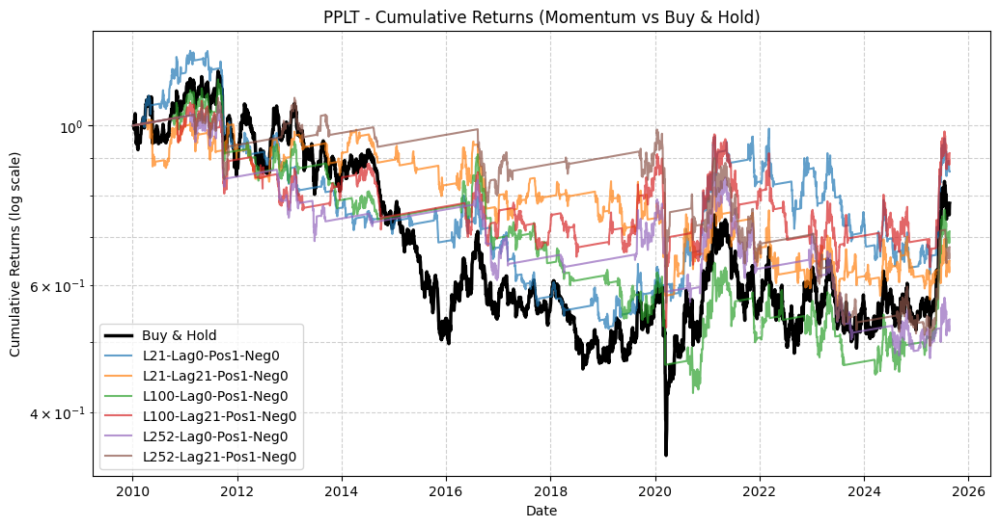

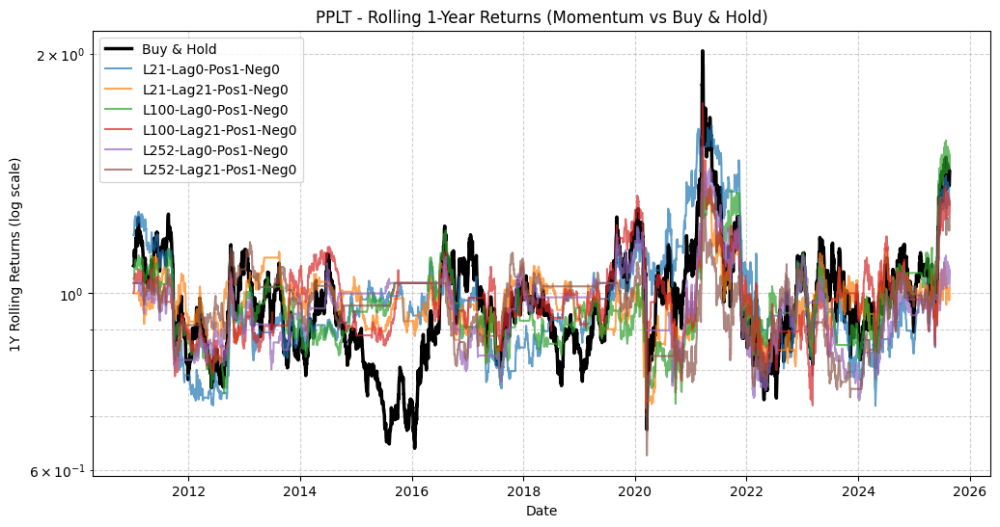

-----------------------------------------


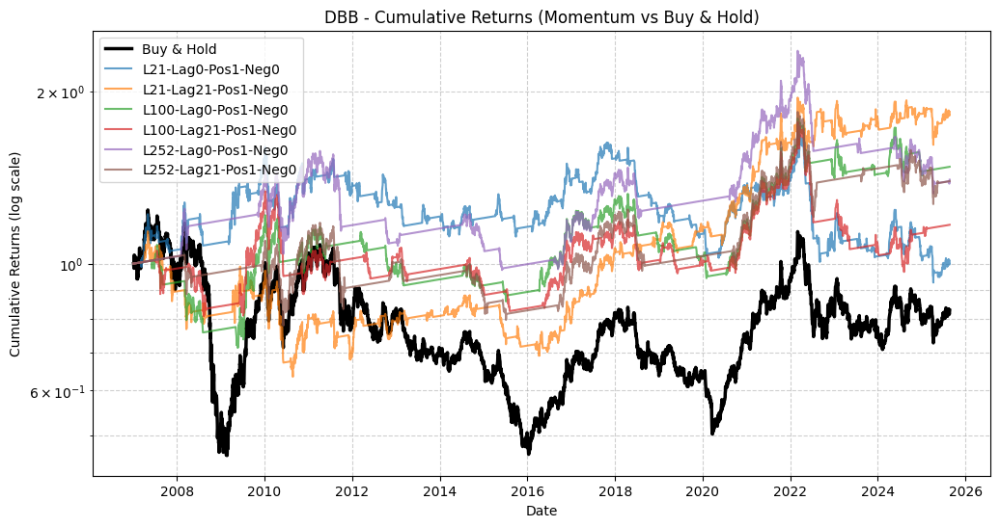

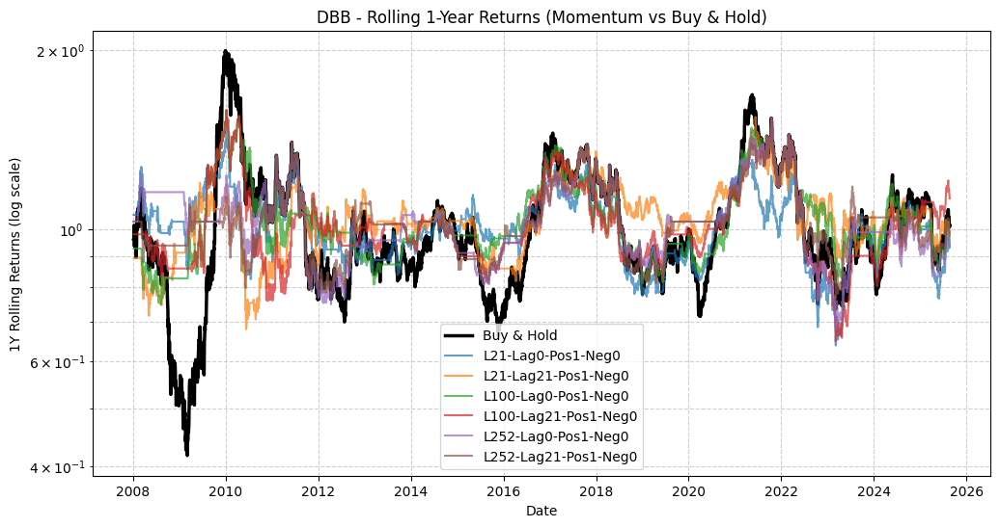

-----------------------------------------


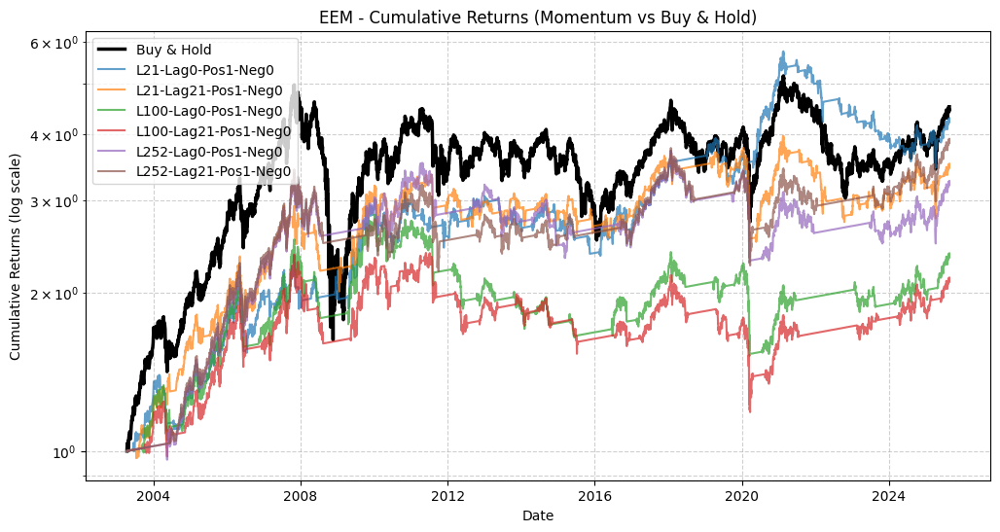

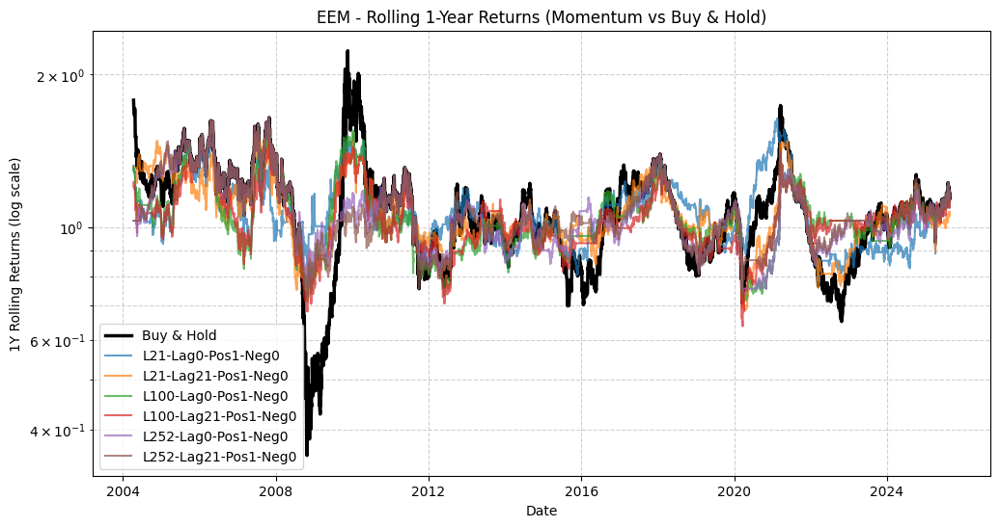

-----------------------------------------


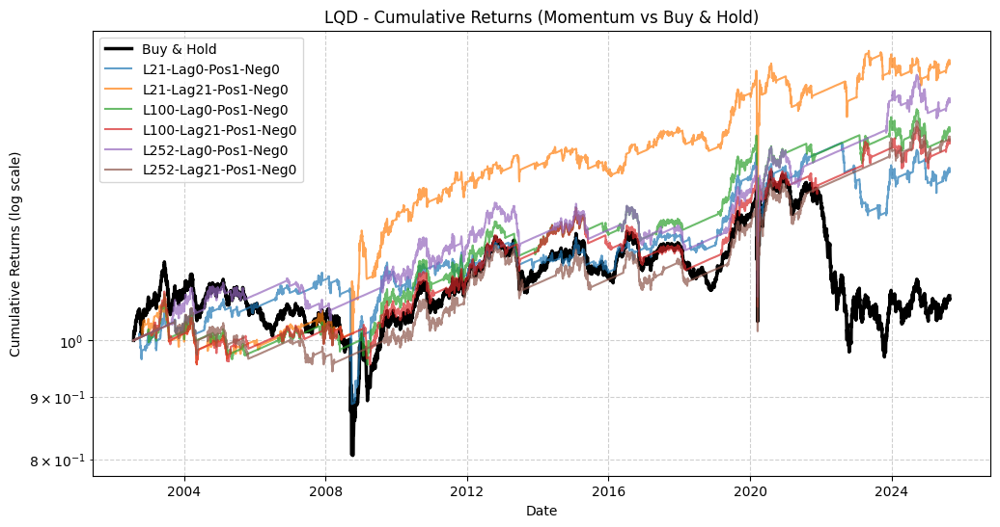

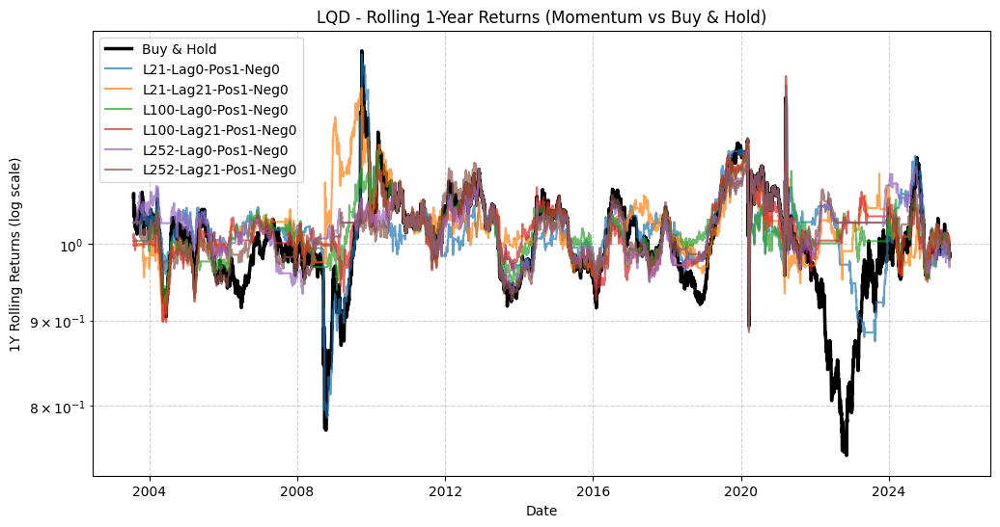

-----------------------------------------


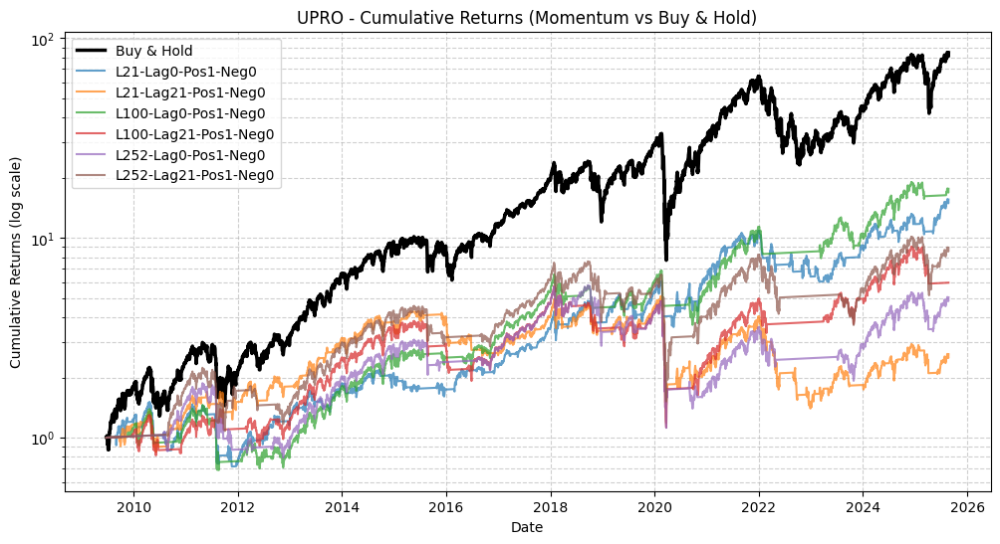

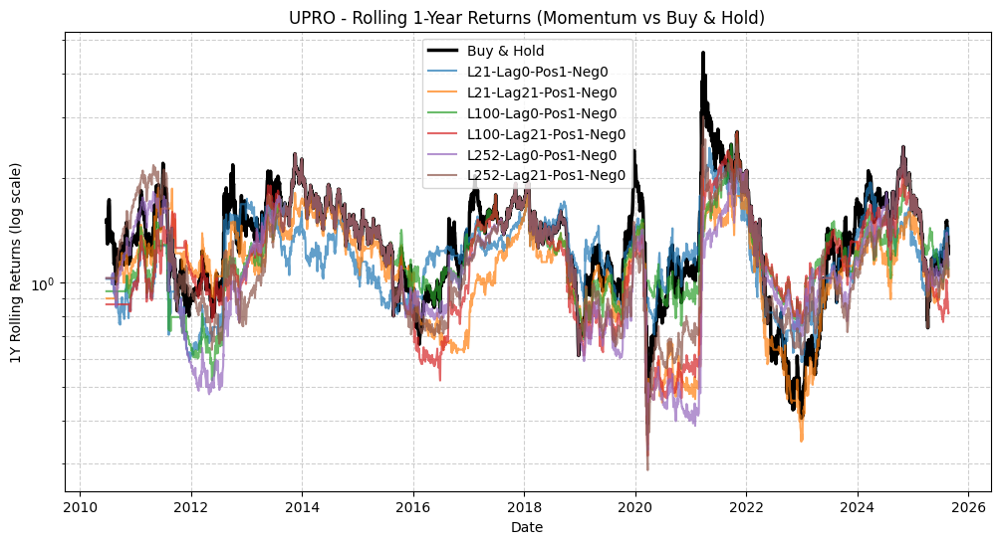

-----------------------------------------


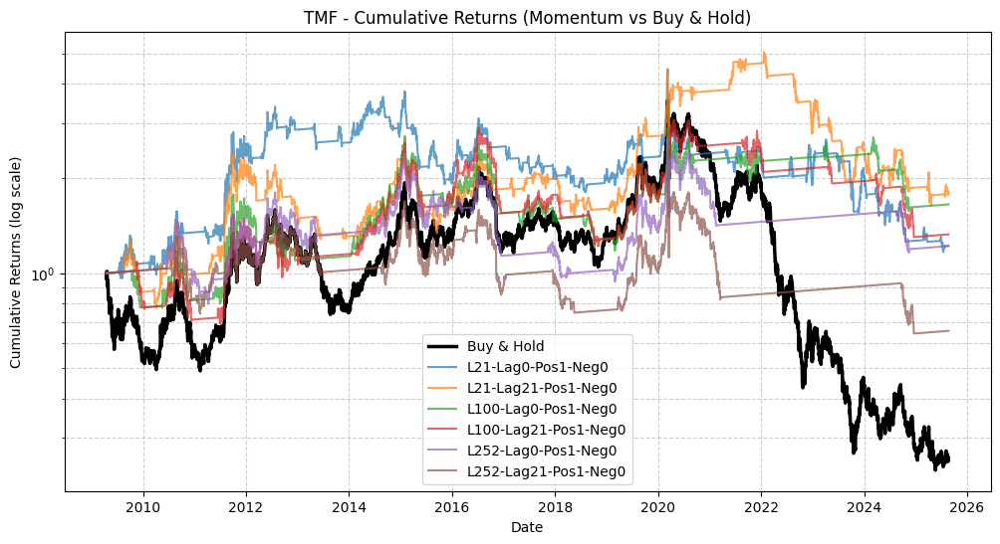

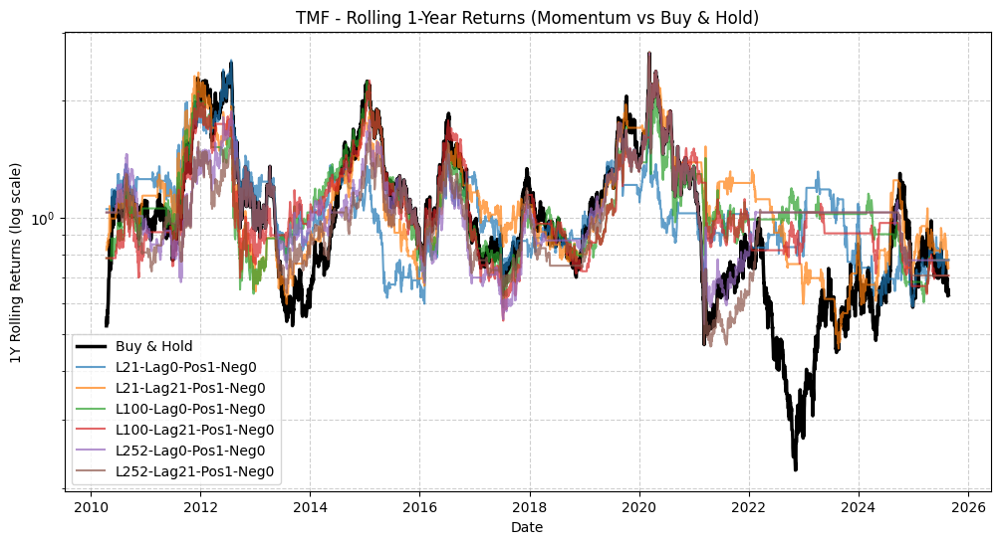

-----------------------------------------


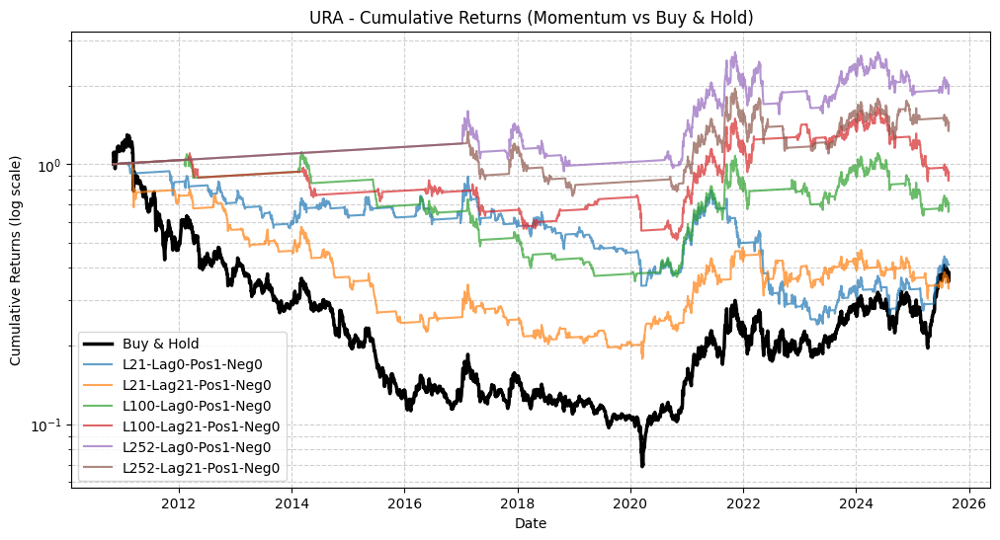

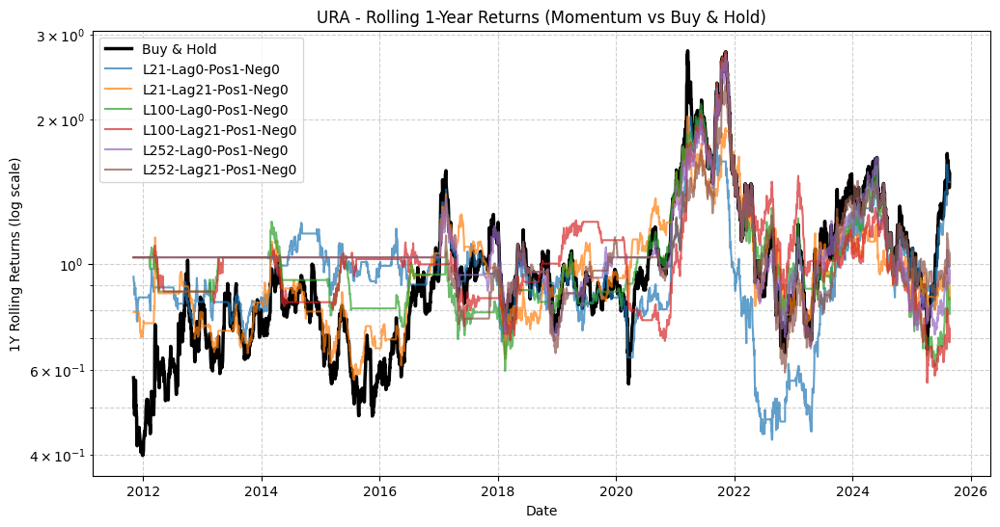

-----------------------------------------


In [ ]:
LOOKFORWARD_PERIOD = 21
REBALANCE_PERIOD = 21
LOOKBACK_PERIODS=[21, 100, 252]
LAG_PERIODS = [0, 21]
POS_SIGNAL_LIST = [1]
NEG_SIGNAL_LIST = [0]


ticker_list = [
    'SPY', 
    'TLT', 
    'GLD',
    'USO',
    'DBA',
    'PPLT',
    'DBB',
    'EEM',
    'LQD',
    'UPRO',
    'TMF',
    'URA'
]
for ticker in ticker_list:
    plot_momentum_backtests(ticker, LOOKBACK_PERIODS, LAG_PERIODS, POS_SIGNAL_LIST, NEG_SIGNAL_LIST)
    print('-----------------------------------------')

# Walk forward optimization

  0%|          | 0/5805 [00:00<?, ?it/s]

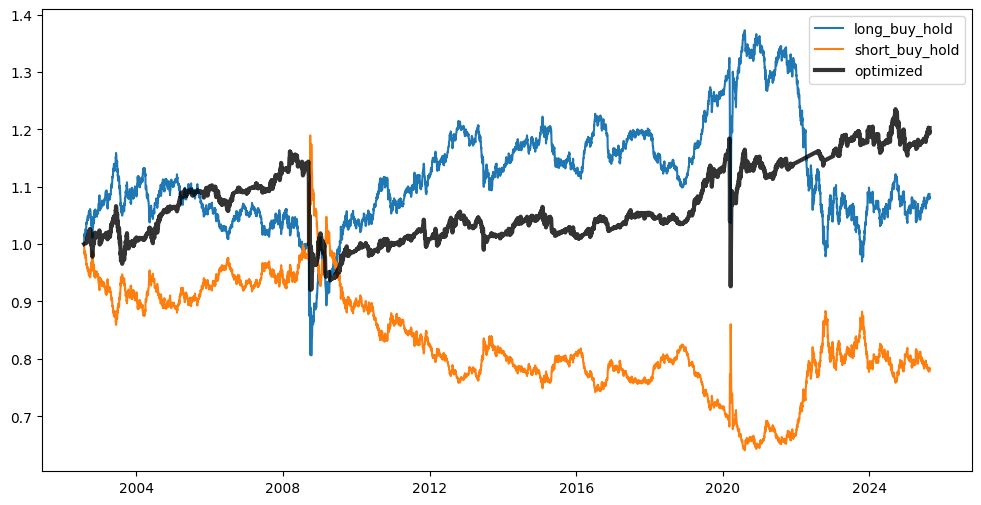

In [ ]:


def walkforward_optimization(
    ticker,
    strat_list: list,
    rebalance_period=21,
    interest_rate=0.03, 
    obs_period=252 * 2,
    obs_weights=[1, 0],
    optim_mode='weighted', # 'equal', 'weighted'
    top_k=1,
):
    df = pd.DataFrame()
    for strat_name, strat_df in strat_list:
        if df.shape[0] == 0:
            df['long_buy_hold_returns'] = strat_df['market_returns']
            df['long_buy_hold_cumulative_returns'] = strat_df['market_cumulative_returns']
            df['long_buy_hold_signal'] = 1
            
            df['short_buy_hold_returns'] = -strat_df['market_returns']
            df['short_buy_hold_cumulative_returns'] = (1 + df['short_buy_hold_returns']).cumprod()
            df['short_buy_hold_signal'] = -1

            df['market_returns'] = strat_df['market_returns']
        
        df[f'{strat_name}_returns'] = strat_df['strategy_returns']
        df[f'{strat_name}_cumulative_returns'] = strat_df['cumulative_returns']
        df[f'{strat_name}_signal'] = strat_df['signal']
    df = df.copy()
    strat_names = []
    for col in df.columns:
        if not col.endswith('cumulative_returns'): continue
        strat_name = col.replace('_cumulative_returns', '')
        strat_names.append(strat_name)
        
        df[f'{strat_name}_obs_return'] = (obs_weights[0] * df[f'{strat_name}_cumulative_returns'] + 
                                          obs_weights[1] * (df[f'{strat_name}_returns'] + 1).rolling(obs_period, min_periods=1).apply(np.prod))
    df = df.copy()
        

    

    signal_list = []
    for i, r in tqdm(df.iterrows(), total=df.shape[0]):

        performance_vector = []
        for strat_name in strat_names:
            performance_vector.append([strat_name, r[f'{strat_name}_obs_return'], r[f'{strat_name}_signal']])
        performance_vector = [f for f in performance_vector if f[1] > 0]
        performance_vector.sort(key=lambda x: x[1], reverse=True)
                
        if top_k > 0:
            performance_vector = performance_vector[:top_k]
        
        if optim_mode == 'equal':
            if top_k > 0:
                weights = np.ones(top_k)
            else:
                weights = np.ones(len(performance_vector))
        elif optim_mode == 'weighted':
            weights = np.array([f[1] for f in performance_vector])
        else:
            raise ValueError('optim_mode not recognized')
        
        weights = weights / np.sum(weights)
        signal = np.array([f[2] for f in performance_vector])
        signal = np.dot(weights, signal)

        # print(i, signal, performance_vector)
        # signal = [f[2] for f in performance_vector if f[0] == 'lookback21_lag21_pos1_neg0'][0]
        signal_list.append(signal)
    
    # print(signal_list)
    df['optimized_signal'] = signal_list


    # Rebalance positions
    rebalance_flags = (np.arange(len(df)) % rebalance_period == 0)
    df['position'] = df['optimized_signal'].where(rebalance_flags).ffill().fillna(0)

    # Daily risk-free rate
    rf_daily = (1 + interest_rate)**(1/252) - 1
    
    # Strategy returns: weighted combination of risky asset and cash
    df['optimized_strategy_returns'] = df['market_returns'] * df['position'] \
                             + rf_daily * (1 - df['position'].abs())
    
    df['optimized_strategy_returns'] = df['optimized_strategy_returns'].fillna(0.0)
    
    # Cumulative returns
    df['optimized_cumulative_returns'] = (1 + df['optimized_strategy_returns']).cumprod()

    

    plt.figure(figsize=(12, 6))
    plt.plot(df.index, df['long_buy_hold_cumulative_returns'], label='long_buy_hold')
    plt.plot(df.index, df['short_buy_hold_cumulative_returns'], label='short_buy_hold')
    plt.plot(df.index, df['optimized_cumulative_returns'], label='optimized', color='black', linewidth=3, alpha=0.8)
    
    plt.legend()
    plt.show()

    
    


ticker = 'LQD'
df = price_data[ticker]
strat_list = []
for lookback_period in LOOKBACK_PERIODS:
    for lag_period in LAG_PERIODS:
        for pos_signal, neg_signal in [(1, 0), (1, -1), (-1, 1)]:
            strat_returns = get_momentum_returns(
                df,
                lookback_period,
                lag_period,
                pos_signal,
                neg_signal,
            )
            strat_signal = get_momentum_signal(
                df,
                lookback_period,
                lag_period,
                pos_signal,
                neg_signal,
            )
            strat_returns['signal'] = strat_signal
            name = f"lookback{lookback_period}_lag{lag_period}_pos{pos_signal}_neg{neg_signal}"
                
            # print(name)
            # display(strat_returns)
            strat_list.append([name, strat_returns])




walkforward_optimization(
    ticker, 
    strat_list, 
    obs_period=252, 
    obs_weights=[1, 0], 
    optim_mode='weighted', 
    top_k=5
)



# Weight based

  0%|          | 0/8198 [00:00<?, ?it/s]

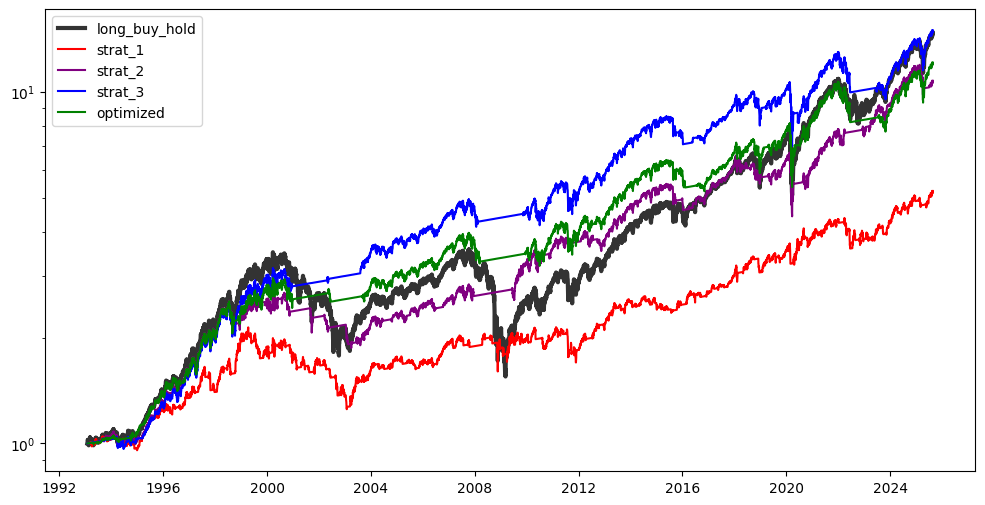

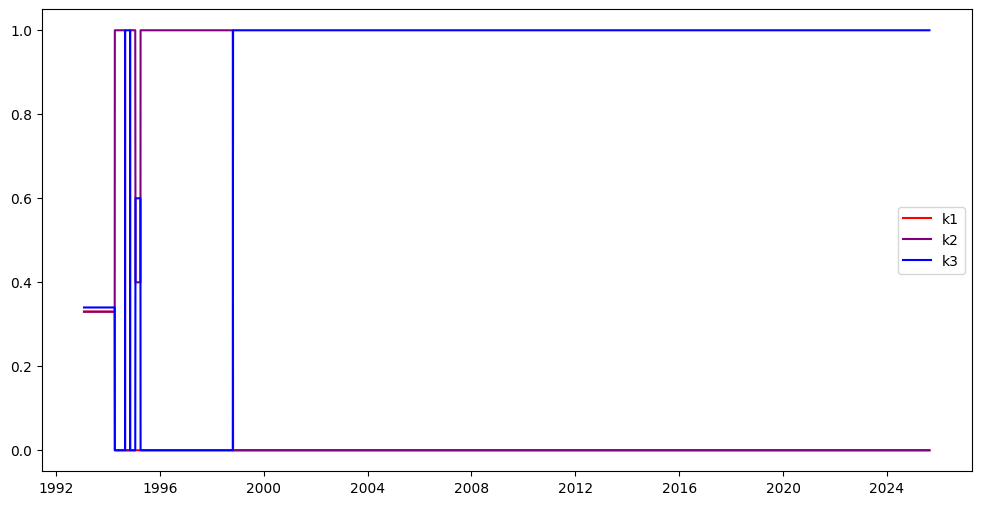

  0%|          | 0/5805 [00:00<?, ?it/s]

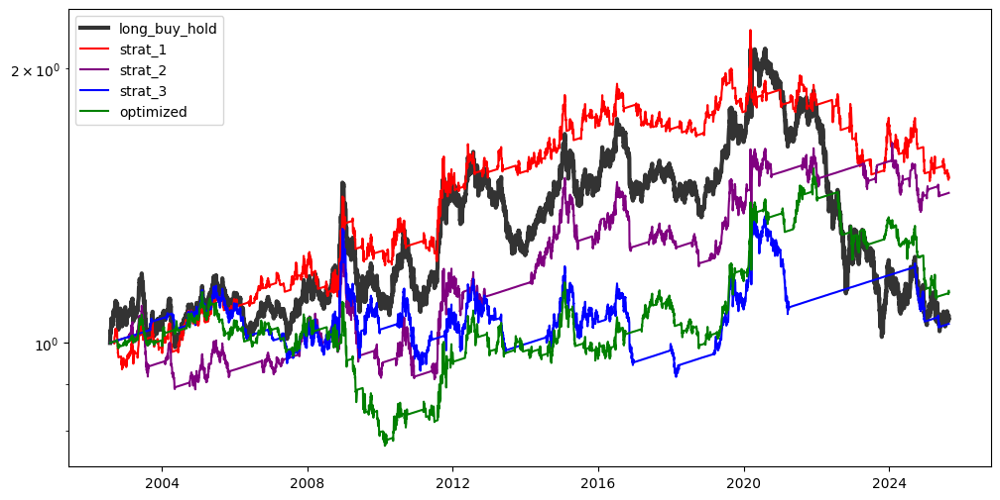

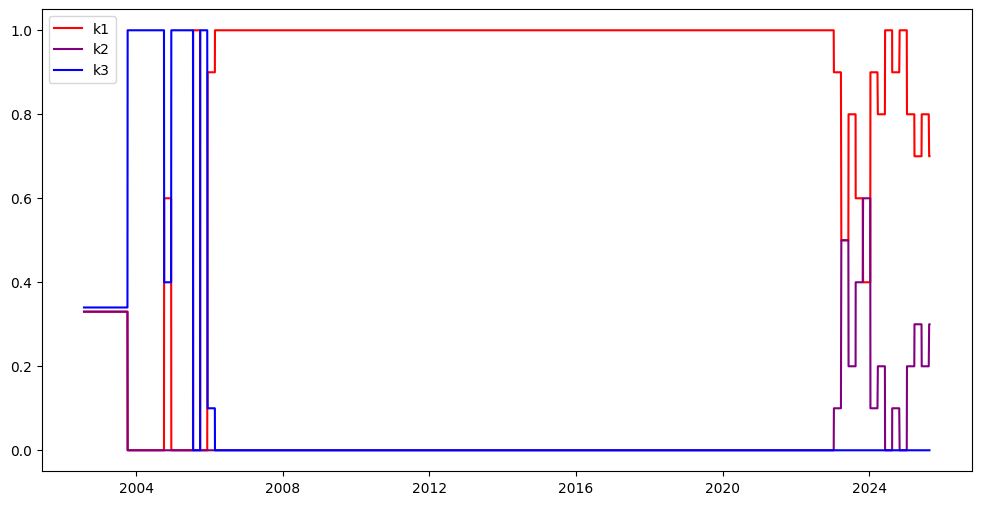

  0%|          | 0/4688 [00:00<?, ?it/s]

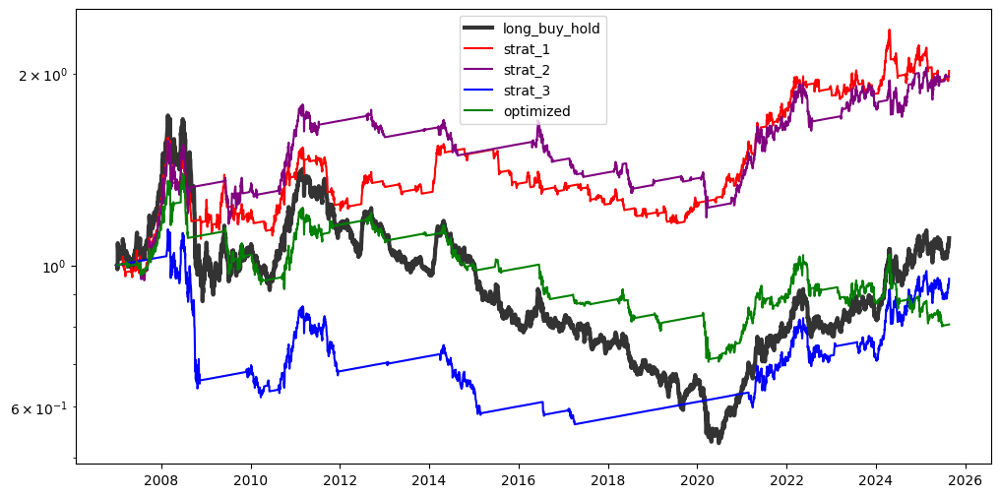

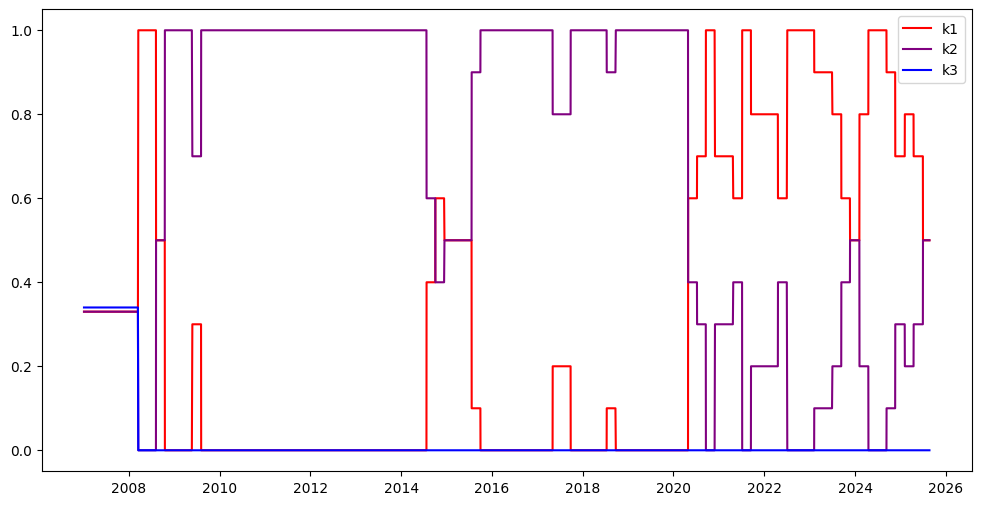

In [ ]:
def parameter_optimization(
    ticker,
    strat_1_params,
    strat_2_params,
    strat_3_params,
    rebalance_period=21,
    interest_rate=0.03,
    metric='sr', # 'cagr' or 'sr'
    
):  
    
    strat_1 = get_momentum_signal(
        df=price_data[ticker],
        lookback_period=strat_1_params['lookback_period'],
        lag_period=strat_1_params['lag_period'],
        pos_signal=strat_1_params['p'], 
        neg_signal=strat_1_params['n'],
    )
    strat_2 = get_momentum_signal(
        df=price_data[ticker],
        lookback_period=strat_2_params['lookback_period'],
        lag_period=strat_2_params['lag_period'],
        pos_signal=strat_2_params['p'], 
        neg_signal=strat_2_params['n'],
    )
    strat_3 = get_momentum_signal(
        df=price_data[ticker],
        lookback_period=strat_3_params['lookback_period'],
        lag_period=strat_3_params['lag_period'],
        pos_signal=strat_3_params['p'], 
        neg_signal=strat_3_params['n'],
    )

    

    df = get_momentum_returns(
        price_data[ticker],
        lookback_period=21,
        lag_period=21
    )[['market_returns', 'market_cumulative_returns']].copy()

    df['strat_1_signal'] = strat_1
    df['strat_2_signal'] = strat_2
    df['strat_3_signal'] = strat_3

    df['strat_1_cumulative_returns'] = get_momentum_returns(
        df=price_data[ticker],
        lookback_period=strat_1_params['lookback_period'],
        lag_period=strat_1_params['lag_period'],
        pos_signal=strat_1_params['p'], 
        neg_signal=strat_1_params['n'],
        rebalance_period=rebalance_period
    )['cumulative_returns']
    df['strat_2_cumulative_returns'] = get_momentum_returns(
        df=price_data[ticker],
        lookback_period=strat_2_params['lookback_period'],
        lag_period=strat_2_params['lag_period'],
        pos_signal=strat_2_params['p'], 
        neg_signal=strat_2_params['n'],
        rebalance_period=rebalance_period
    )['cumulative_returns']
    df['strat_3_cumulative_returns'] = get_momentum_returns(
        df=price_data[ticker],
        lookback_period=strat_3_params['lookback_period'],
        lag_period=strat_3_params['lag_period'],
        pos_signal=strat_3_params['p'], 
        neg_signal=strat_3_params['n'],
        rebalance_period=rebalance_period
    )['cumulative_returns']

    

    recalc_counter = 0
    rebal_counter = 0
    best_params = (0.33, 0.33, 0.34, -np.inf)
    best_params_list = []
    signal = 1.0
    signal_list = []
    for i, r in tqdm(df.iterrows(), total=df.shape[0]):
        if recalc_counter % 50 == 0 and recalc_counter > 252:
            # recalculation day

            df_window = df[:i].copy()
            df_window['signal'] = 0.0

            # trial
            best_params = (0.33, 0.33, 0.34, -np.inf)

            df_perf = {
                'k1': [],
                'k2': [],
                'k3': [],
                'obs': [],
            }
            for k1 in np.arange(0, 1.11, 0.1):
                
                for k2 in np.arange(0, 1.01 - k1, 0.1):
                    k3 = 1 - k1 - k2
                    # print(k1, k2, k3)
                    assert 0.99 < k1 + k2 + k3 < 1.01
                    df_trial = df_window.copy()
                    df_trial['signal'] = (k1 * df_trial['strat_1_signal']
                                          + k2 * df_trial['strat_2_signal']
                                          + k3 * df_trial['strat_3_signal'])

                    # Rebalance positions
                    rebalance_flags = (np.arange(len(df_trial)) % rebalance_period == 0)
                    df_trial['position'] = df_trial['signal'].where(rebalance_flags).ffill().fillna(0)

                    # Daily risk-free rate
                    rf_daily = (1 + interest_rate)**(1/252) - 1
                    
                    # Strategy returns: weighted combination of risky asset and cash
                    df_trial['strategy_returns'] = df_trial['market_returns'] * df_trial['position'] \
                                            + rf_daily * (1 - df_trial['position'].abs())
                    
                    df_trial['strategy_returns'] = df_trial['strategy_returns'].fillna(0.0)
                    
                    cagr = np.prod(df_trial['strategy_returns'] + 1) ** (252 / df_trial.shape[0]) - 1
                    vol = df_trial['strategy_returns'].std() ** np.sqrt(252 / df_trial.shape[0])

                    df_recent = df_trial[-252 * 2:]
                    cagr_recent = np.prod(df_recent['strategy_returns'] + 1) ** (252 / df_recent.shape[0]) - 1
                    vol_recent = df_recent['strategy_returns'].std() ** np.sqrt(252 / df_recent.shape[0])

                    # cagr = np.mean([cagr, cagr_recent * 0.5])
                    # vol = np.mean([vol, vol_recent * 0.5])
                    sharpe = cagr / vol
                    if metric == 'sr':
                        obs = sharpe
                    else:
                        obs = cagr

                    if obs > best_params[3]:
                        best_params = (k1, k2, k3, obs)
                    
                    df_perf['k1'].append(k1)
                    df_perf['k2'].append(k2)
                    df_perf['k3'].append(k3)
                    df_perf['obs'].append(obs)

            df_perf = pd.DataFrame(df_perf)
            df_perf = df_perf.sort_values('obs', ascending=False)
            # display(df_perf.head())
            # print(df_perf.loc[df_perf['k1'] == 1.0], df_trial.iloc[-1]['strat_1_cumulative_returns'])
            # print(df_perf.loc[df_perf['k2'] == 1.0], df_trial.iloc[-1]['strat_2_cumulative_returns'])
            # print(df_perf.loc[df_perf['k3'] == 1.0], df_trial.iloc[-1]['strat_3_cumulative_returns'])
                    
            
        if rebal_counter % 21 == 0:
            # calculate signal
            
            signal = (best_params[0] * r['strat_1_signal']
                      + best_params[1] * r['strat_2_signal']
                      + best_params[2] * r['strat_3_signal'])
            
        signal_list.append(signal)            
        best_params_list.append(best_params)

        recalc_counter += 1
        rebal_counter += 1

    df['optimized_signal'] = signal_list

    # Rebalance positions
    rebalance_flags = (np.arange(len(df)) % rebalance_period == 0)
    df['position'] = df['optimized_signal'].where(rebalance_flags).ffill().fillna(0)

    # Daily risk-free rate
    rf_daily = (1 + interest_rate)**(1/252) - 1
    
    # Strategy returns: weighted combination of risky asset and cash
    df['optimized_strategy_returns'] = df['market_returns'] * df['position'] \
                             + rf_daily * (1 - df['position'].abs())
    
    df['optimized_strategy_returns'] = df['optimized_strategy_returns'].fillna(0.0)
    
    # Cumulative returns
    df['optimized_cumulative_returns'] = (1 + df['optimized_strategy_returns']).cumprod()

    

    plt.figure(figsize=(12, 6))
    plt.plot(df.index, df['market_cumulative_returns'], label='long_buy_hold', color='black', linewidth=3, alpha=0.8)
    plt.plot(df.index, df['strat_1_cumulative_returns'], label='strat_1', color='red')
    plt.plot(df.index, df['strat_2_cumulative_returns'], label='strat_2', color='purple')
    plt.plot(df.index, df['strat_3_cumulative_returns'], label='strat_3', color='blue')
    plt.plot(df.index, df['optimized_cumulative_returns'], label='optimized', color='green')
    plt.yscale('log')
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(df.index, [f[0] for f in best_params_list], label='k1', color='red')
    plt.plot(df.index, [f[1] for f in best_params_list], label='k2', color='purple')
    plt.plot(df.index, [f[2] for f in best_params_list], label='k3', color='blue')
    plt.legend()
    plt.show()
    


ticker = 'SPY'
df = price_data[ticker]
parameter_optimization(
    ticker,
    rebalance_period=10,
    interest_rate=0.03,
    metric='cagr', # 'cagr' or 'sr'
    strat_1_params={
        'lookback_period': 21,
        'lag_period': 0,
        'p': 1,
        'n': 0
    },
    strat_2_params={
        'lookback_period': 100,
        'lag_period': 21,
        'p': 1,
        'n': 0
    },
    strat_3_params={
        'lookback_period': 252,
        'lag_period': 21,
        'p': 1,
        'n': 0
    },
)


ticker = 'TLT'
df = price_data[ticker]
parameter_optimization(
    ticker,
    rebalance_period=10,
    interest_rate=0.03,
    metric='cagr', # 'cagr' or 'sr'
    strat_1_params={
        'lookback_period': 21,
        'lag_period': 0,
        'p': 1,
        'n': 0
    },
    strat_2_params={
        'lookback_period': 100,
        'lag_period': 21,
        'p': 1,
        'n': 0
    },
    strat_3_params={
        'lookback_period': 252,
        'lag_period': 21,
        'p': 1,
        'n': 0
    },
)

ticker = 'DBA'
df = price_data[ticker]
parameter_optimization(
    ticker,
    rebalance_period=10,
    interest_rate=0.03,
    metric='cagr', # 'cagr' or 'sr'
    strat_1_params={
        'lookback_period': 21,
        'lag_period': 0,
        'p': 1,
        'n': 0
    },
    strat_2_params={
        'lookback_period': 100,
        'lag_period': 21,
        'p': 1,
        'n': 0
    },
    strat_3_params={
        'lookback_period': 252,
        'lag_period': 21,
        'p': 1,
        'n': 0
    },
)

### Walk-forward

In [ ]:
def walkforward_momentum_strategy(
    ticker,
    lookback_list,
    lag_list,
    neg_signal_list,
    pos_signal=1,
    rebalance_period=21,
    interest_rate=0.03,
    training_window=252,
    metric="cumulative",        # "cumulative" or "sharpe"
    selection_mode="best",      # "best", "ensemble_topn", "ensemble_weighted"
    top_n=3                     # how many strategies to include in ensemble
):
    """
    Walk-forward momentum strategy:
      - Select best parameters OR
      - Use ensemble of top-N parameter sets, equally or metric-weighted.

    Parameters
    ----------
    ticker : str
        Ticker symbol (must exist in price_data).
    lookback_list, lag_list : list of int
        Candidate parameter values for momentum lookback and lag.
    neg_signal_list : list of int
        Candidate values for short/neutral signal (e.g., [0, -1]).
    pos_signal : int or float
        Value for long signal.
    rebalance_period : int
        Days between rebalancing trades.
    interest_rate : float
        Annualized risk-free interest rate.
    training_window : int
        Lookback window (in days) for selecting the best parameters.
        If -1, use the entire history up to t.
    metric : str
        Performance metric to optimize: "cumulative" or "sharpe".
    selection_mode : str
        Strategy selection method: "best", "ensemble_topn", "ensemble_weighted".
    top_n : int
        Number of top parameter sets to include in ensemble.

    Returns
    -------
    pd.DataFrame
        Strategy performance with chosen parameters through time.
    """
    df = price_data[ticker].copy().sort_index()
    df['market_returns'] = df['close'].pct_change().fillna(0)

    strat_returns = []
    chosen_params = []

    def evaluate_performance(returns):
        """Evaluate by chosen metric."""
        if metric == "cumulative":
            return (1 + returns).prod() - 1
        elif metric == "sharpe":
            if returns.std() == 0:
                return -np.inf
            return (returns.mean() / returns.std()) * np.sqrt(252)
        else:
            raise ValueError("metric must be 'cumulative' or 'sharpe'")

    for t in tqdm(range(len(df))):
        # Not enough history yet
        if t < 21:
            strat_returns.append(0.0)
            chosen_params.append(("None", None, None, "none"))
            continue

        # Training window
        if training_window == -1:
            window_df = df.iloc[:t]
        else:
            window_df = df.iloc[max(0, t - training_window - 252):t]

        # Collect candidate performances
        candidates = []

        # Buy & Hold
        bh_returns = window_df['market_returns']
        candidates.append(("buy_hold", None, None, "bh", evaluate_performance(bh_returns), abs(evaluate_performance(bh_returns))))

        # Momentum candidates
        for lookback in lookback_list:
            for lag in lag_list:
                for neg_signal in neg_signal_list:
                    strat_df = get_momentum_returns(
                        df=window_df,
                        lookback_period=lookback,
                        lag_period=lag,
                        pos_signal=pos_signal,
                        neg_signal=neg_signal,
                        rebalance_period=rebalance_period,
                        interest_rate=interest_rate
                    )
                    perf = evaluate_performance(strat_df['strategy_returns'])
                    candidates.append((lookback, lag, neg_signal, "mom", perf, abs(perf)))

        # Rank by metric
        candidates_sorted = sorted(candidates, key=lambda x: x[5], reverse=True)
        

        if selection_mode == "best":
            # Single best
            final_choice = candidates_sorted[0]

        elif selection_mode in ["ensemble_topn", "ensemble_weighted"]:
            # Top N
            top_candidates = candidates_sorted[:top_n]

            # Apply each candidate to actual history
            signals = []
            weights = []
            for c in top_candidates:
                if c[0] == "buy_hold":
                    sig = df['market_returns'].iloc[t]   # market return for the day
                else:
                    full_strat = get_momentum_returns(
                        df=df.iloc[:t+1],
                        lookback_period=c[0],
                        lag_period=c[1],
                        pos_signal=pos_signal,
                        neg_signal=c[2],
                        rebalance_period=rebalance_period,
                        interest_rate=interest_rate
                    )
                    sig = full_strat['strategy_returns'].iloc[-1]

                signals.append(sig)
                if selection_mode == "ensemble_topn":
                    weight = np.sign(c[4] * 1.0)
                elif selection_mode == "ensemble_weighted":
                    weight = c[4]
                else:
                    raise ValueError("selection mode invalid")
                weights.append(weight)

            # Normalize weights if weighted mode
            sum_weight = np.sum(np.abs(weights))
            weights = [w/sum_weight for w in weights]
            
            # Weighted average of signals
            sig_final = np.dot(signals, weights)
            strat_returns.append(sig_final)
            chosen_param = []
            for i in range(len(top_candidates)):
                p = top_candidates[i][:5]
                p += (weights[i],)
                chosen_param.append(p)
            chosen_params.append(chosen_param)
            continue

        else:
            raise ValueError("selection_mode must be 'best', 'ensemble_topn', or 'ensemble_weighted'")

        # Apply "best" case to actual data
        best = final_choice[0]
        if best[0] == "buy_hold":
            strat_returns.append(df['market_returns'].iloc[t])
        else:
            full_strat = get_momentum_returns(
                df=df.iloc[:t+1],
                lookback_period=best[0],
                lag_period=best[1],
                pos_signal=pos_signal,
                neg_signal=best[2],
                rebalance_period=rebalance_period,
                interest_rate=interest_rate
            )
            strat_returns.append(full_strat['strategy_returns'].iloc[-1])
        chosen_params.append(best[:4])

    df['strategy_returns'] = strat_returns
    df['chosen_params'] = chosen_params
    df['cumulative_returns'] = (1 + df['strategy_returns']).cumprod()
    df['market_cum'] = (1 + df['market_returns']).cumprod()

    return df[['market_returns', 'market_cum', 'strategy_returns', 'cumulative_returns', 'chosen_params']]


-----------------------------------------------------
-----------------------------------------------------


  0%|          | 0/5805 [00:00<?, ?it/s]

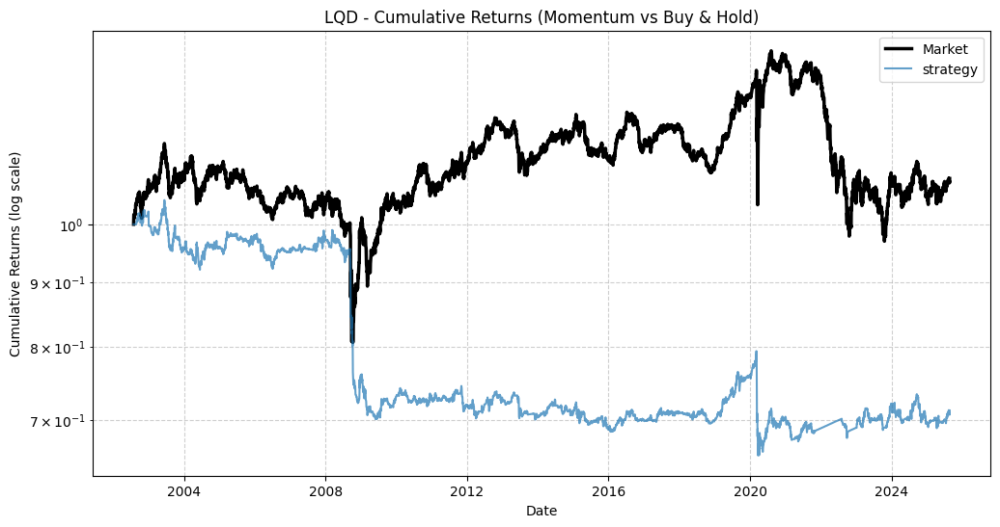

,market_returns,market_cum,strategy_returns,cumulative_returns,chosen_params
Date,,,,,
2002-07-30,0.000000,1.000000,0.000000,1.000000,"(None, None, None, none)"
2002-07-31,0.006116,1.006116,0.000000,1.000000,"(None, None, None, none)"
2002-08-01,0.009805,1.015981,0.000000,1.000000,"(None, None, None, none)"
2002-08-02,0.002039,1.018053,0.000000,1.000000,"(None, None, None, none)"
2002-08-05,-0.002422,1.015586,0.000000,1.000000,"(None, None, None, none)"
...,...,...,...,...,...
2025-08-18,-0.001822,1.080596,-0.001822,0.707530,"[(21, 21, 0, mom, 0.6841887092768721, 0.393964..."
2025-08-19,0.001552,1.082273,0.001552,0.708628,"[(21, 21, 0, mom, 0.6811193397791848, 0.394156..."
2025-08-20,0.000456,1.082766,0.000456,0.708951,"[(21, 21, 0, mom, 0.6837283155611131, 0.393993..."


In [ ]:
for ticker in ticker_list:
    print('-----------------------------------------------------')
    print('-----------------------------------------------------')
    ticker = 'LQD'
    df_output = walkforward_momentum_strategy(
        ticker, 
        lookback_list=LOOKBACK_PERIODS, 
        lag_list=LAG_PERIODS, 
        neg_signal_list=NEG_SIGNAL_LIST,
        pos_signal=1, 
        rebalance_period=21, 
        interest_rate=0.03,
        training_window=-1,
        metric="cumulative",        # "cumulative" or "sharpe"
        selection_mode="ensemble_weighted",      # "best", "ensemble_topn", "ensemble_weighted"
        top_n=3 
    )

    plt.figure(figsize=(12,6))
    
    plt.plot(df_output.index, df_output['market_cum'], label='Market', linewidth=2.5, color="black")
    plt.plot(df_output.index, df_output['cumulative_returns'], label='strategy', alpha=0.7)
    
    plt.yscale('log')
    plt.title(f"{ticker} - Cumulative Returns (Momentum vs Buy & Hold)")
    plt.xlabel("Date")
    plt.ylabel("Cumulative Returns (log scale)")
    plt.legend()
    plt.grid(True, which="both", ls="--", alpha=0.6)
    plt.show()

    display(df_output)

    # plot_chosen_params(df_output, ticker)
    break

In [ ]:
for i, r in df_output.iterrows():
    print(i, r['chosen_params'])

2002-07-30 00:00:00 ('None', None, None, 'none')
2002-07-31 00:00:00 ('None', None, None, 'none')
2002-08-01 00:00:00 ('None', None, None, 'none')
2002-08-02 00:00:00 ('None', None, None, 'none')
2002-08-05 00:00:00 ('None', None, None, 'none')
2002-08-06 00:00:00 ('None', None, None, 'none')
2002-08-07 00:00:00 ('None', None, None, 'none')
2002-08-08 00:00:00 ('None', None, None, 'none')
2002-08-09 00:00:00 ('None', None, None, 'none')
2002-08-12 00:00:00 ('None', None, None, 'none')
2002-08-13 00:00:00 ('None', None, None, 'none')
2002-08-14 00:00:00 ('None', None, None, 'none')
2002-08-15 00:00:00 ('None', None, None, 'none')
2002-08-16 00:00:00 ('None', None, None, 'none')
2002-08-19 00:00:00 ('None', None, None, 'none')
2002-08-20 00:00:00 ('None', None, None, 'none')
2002-08-21 00:00:00 ('None', None, None, 'none')
2002-08-22 00:00:00 ('None', None, None, 'none')
2002-08-23 00:00:00 ('None', None, None, 'none')
2002-08-26 00:00:00 ('None', None, None, 'none')
2002-08-27 00:00:00 

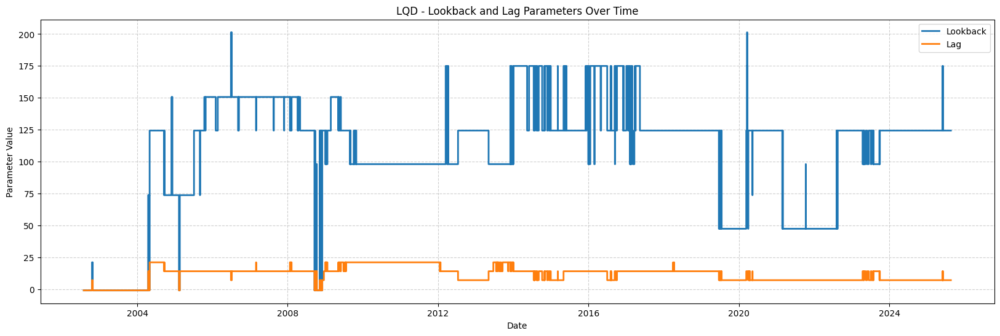

C:\Users\alexr\AppData\Local\Temp\ipykernel_19648\1576209361.py:59: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("bwr")  # blue=0, red=-1, blends if averaged


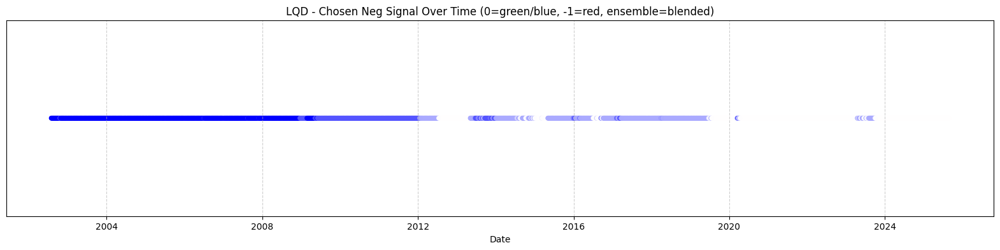

In [ ]:
def plot_chosen_params(df, ticker):
    """
    Plot chosen walk-forward parameters (lookback, lag, neg_signal) over time.
    Handles both single best-parameter mode and ensemble modes.

    Parameters
    ----------
    df : pd.DataFrame
        Output of walkforward_momentum_strategy with 'chosen_params' column.
    ticker : str
        Ticker symbol (for title).
    """
    df_params = df.copy()

    lookback_vals, lag_vals, neg_vals = [], [], []

    for entry in df_params['chosen_params']:
        if isinstance(entry, list):  
            # Ensemble mode: average across top-N
            lb = np.mean([e[0] if isinstance(e[0], (int, float)) else np.nan for e in entry])
            lg = np.mean([e[1] if isinstance(e[1], (int, float)) else np.nan for e in entry])
            neg = np.mean([e[2] if isinstance(e[2], (int, float)) else np.nan for e in entry])
            lookback_vals.append(lb if not np.isnan(lb) else -1)
            lag_vals.append(lg if not np.isnan(lg) else -1)
            neg_vals.append(neg if not np.isnan(neg) else -1)

        else:  
            # Single best mode
            if entry[0] == "buy_hold":
                lookback_vals.append(-1)
                lag_vals.append(-1)
                neg_vals.append(-1)
            elif entry[0] is None or entry[0] == "None":
                lookback_vals.append(-1)
                lag_vals.append(-1)
                neg_vals.append(-1)
            else:
                lookback_vals.append(entry[0])
                lag_vals.append(entry[1])
                neg_vals.append(entry[2])

    df_params['lookback'] = lookback_vals
    df_params['lag'] = lag_vals
    df_params['neg_signal'] = neg_vals

    # Step plot for lookback and lag
    plt.figure(figsize=(20,6))
    plt.step(df_params.index, df_params['lookback'], where='post', label='Lookback', linewidth=2)
    plt.step(df_params.index, df_params['lag'], where='post', label='Lag', linewidth=2)
    plt.xlabel("Date")
    plt.ylabel("Parameter Value")
    plt.title(f"{ticker} - Lookback and Lag Parameters Over Time")
    plt.grid(True, ls="--", alpha=0.6)
    plt.legend()
    plt.show()

    # Scatter plot for neg_signal
    plt.figure(figsize=(20,4))
    cmap = plt.cm.get_cmap("bwr")  # blue=0, red=-1, blends if averaged
    normed_vals = (df_params['neg_signal'] + 1) / 2  # map [-1,0] → [0,0.5], NaNs handled
    plt.scatter(df_params.index, [0.5]*len(df_params),
                c=cmap(normed_vals.fillna(0.5)),
                s=20, alpha=0.6)
    plt.title(f"{ticker} - Chosen Neg Signal Over Time (0=green/blue, -1=red, ensemble=blended)")
    plt.xlabel("Date")
    plt.yticks([])
    plt.grid(True, ls="--", alpha=0.6)
    plt.show()


plot_chosen_params(df_output, ticker)

-----------------------------------------------------
-----------------------------------------------------
-----------------------------------------------------
-----------------------------------------------------
-----------------------------------------------------
-----------------------------------------------------
-----------------------------------------------------
-----------------------------------------------------
-----------------------------------------------------
-----------------------------------------------------
DBA


  0%|          | 0/4688 [00:00<?, ?it/s]

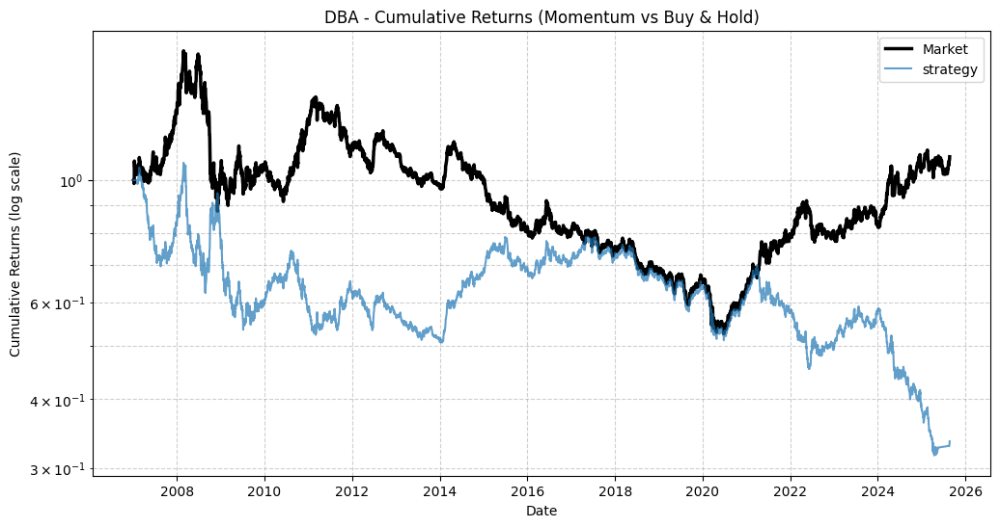

In [ ]:
for ticker in ticker_list:
    print('-----------------------------------------------------')
    print('-----------------------------------------------------')
    if ticker not in ['URA', 'DBA', 'DBB', 'PPLT']:
        continue
    print(ticker)
    df_output = walkforward_momentum_strategy(
        ticker, 
        lookback_list=LOOKBACK_PERIODS, 
        lag_list=LAG_PERIODS, 
        neg_signal_list=NEG_SIGNAL_LIST,
        pos_signal=1, 
        rebalance_period=21, 
        interest_rate=0.03,
        training_window=-1,
        metric="cumulative",        # "cumulative" or "sharpe"
        selection_mode="ensemble_topn",      # "best", "ensemble_topn", "ensemble_weighted"
        top_n=1
    )

    plt.figure(figsize=(12,6))
    
    plt.plot(df_output.index, df_output['market_cum'], label='Market', linewidth=2.5, color="black")
    plt.plot(df_output.index, df_output['cumulative_returns'], label='strategy', alpha=0.7)
    
    plt.yscale('log')
    plt.title(f"{ticker} - Cumulative Returns (Momentum vs Buy & Hold)")
    plt.xlabel("Date")
    plt.ylabel("Cumulative Returns (log scale)")
    plt.legend()
    plt.grid(True, which="both", ls="--", alpha=0.6)
    plt.show()
    break

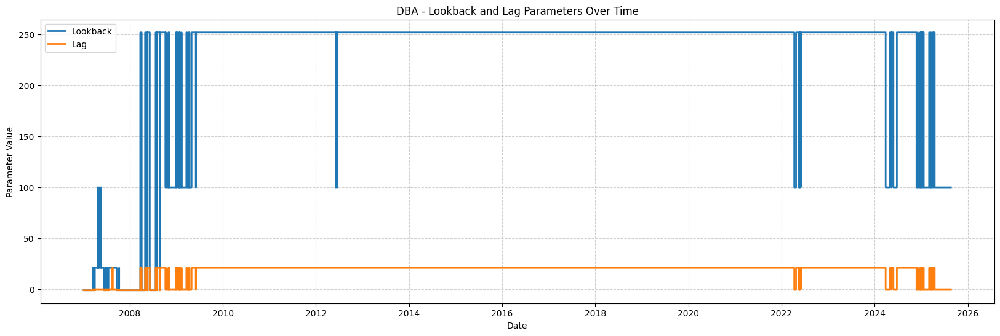

C:\Users\alexr\AppData\Local\Temp\ipykernel_19648\1576209361.py:59: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("bwr")  # blue=0, red=-1, blends if averaged


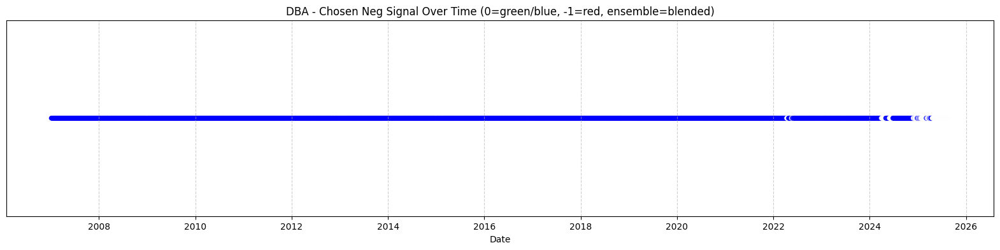

In [ ]:
def plot_chosen_params(df, ticker):
    """
    Plot chosen walk-forward parameters (lookback, lag, neg_signal) over time.
    Handles both single best-parameter mode and ensemble modes.

    Parameters
    ----------
    df : pd.DataFrame
        Output of walkforward_momentum_strategy with 'chosen_params' column.
    ticker : str
        Ticker symbol (for title).
    """
    df_params = df.copy()

    lookback_vals, lag_vals, neg_vals = [], [], []

    for entry in df_params['chosen_params']:
        if isinstance(entry, list):  
            # Ensemble mode: average across top-N
            lb = np.mean([e[0] if isinstance(e[0], (int, float)) else np.nan for e in entry])
            lg = np.mean([e[1] if isinstance(e[1], (int, float)) else np.nan for e in entry])
            neg = np.mean([e[2] if isinstance(e[2], (int, float)) else np.nan for e in entry])
            lookback_vals.append(lb if not np.isnan(lb) else -1)
            lag_vals.append(lg if not np.isnan(lg) else -1)
            neg_vals.append(neg if not np.isnan(neg) else -1)

        else:  
            # Single best mode
            if entry[0] == "buy_hold":
                lookback_vals.append(-1)
                lag_vals.append(-1)
                neg_vals.append(-1)
            elif entry[0] is None or entry[0] == "None":
                lookback_vals.append(-1)
                lag_vals.append(-1)
                neg_vals.append(-1)
            else:
                lookback_vals.append(entry[0])
                lag_vals.append(entry[1])
                neg_vals.append(entry[2])

    df_params['lookback'] = lookback_vals
    df_params['lag'] = lag_vals
    df_params['neg_signal'] = neg_vals

    # Step plot for lookback and lag
    plt.figure(figsize=(20,6))
    plt.step(df_params.index, df_params['lookback'], where='post', label='Lookback', linewidth=2)
    plt.step(df_params.index, df_params['lag'], where='post', label='Lag', linewidth=2)
    plt.xlabel("Date")
    plt.ylabel("Parameter Value")
    plt.title(f"{ticker} - Lookback and Lag Parameters Over Time")
    plt.grid(True, ls="--", alpha=0.6)
    plt.legend()
    plt.show()

    # Scatter plot for neg_signal
    plt.figure(figsize=(20,4))
    cmap = plt.cm.get_cmap("bwr")  # blue=0, red=-1, blends if averaged
    normed_vals = (df_params['neg_signal'] + 1) / 2  # map [-1,0] → [0,0.5], NaNs handled
    plt.scatter(df_params.index, [0.5]*len(df_params),
                c=cmap(normed_vals.fillna(0.5)),
                s=20, alpha=0.6)
    plt.title(f"{ticker} - Chosen Neg Signal Over Time (0=green/blue, -1=red, ensemble=blended)")
    plt.xlabel("Date")
    plt.yticks([])
    plt.grid(True, ls="--", alpha=0.6)
    plt.show()


plot_chosen_params(df_output, ticker)

### Visualization

In [ ]:
import matplotlib.pyplot as plt




In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_param_heatmap(ticker, lookback_list, lag_list, neg_signal=0, 
                       pos_signal=1, rebalance_period=21, interest_rate=0.03, 
                       training_window=252, metric="cumulative"):
    """
    Plot heatmap of parameter performance for (lookback, lag).
    
    Parameters
    ----------
    ticker : str
        Ticker symbol (must exist in price_data).
    lookback_list : list of int
        Candidate momentum lookback periods.
    lag_list : list of int
        Candidate lag periods.
    neg_signal : int
        Value for negative signal (0 or -1).
    pos_signal : int
        Value for positive signal.
    rebalance_period : int
        Rebalance frequency in days.
    interest_rate : float
        Annualized risk-free interest rate.
    training_window : int
        Window length (in days) to evaluate performance.
    metric : str, {"cumulative", "sharpe"}
        Performance metric to color the heatmap.
    """
    df = price_data[ticker].copy().sort_index()
    if training_window > 0:
        df = df.iloc[-training_window:]  # restrict to last N days
    
    performance = np.zeros((len(lag_list), len(lookback_list)))
    
    for i, lag in enumerate(lag_list):
        for j, lookback in enumerate(lookback_list):
            strat_df = get_momentum_returns(
                df=df,
                lookback_period=lookback,
                lag_period=lag,
                pos_signal=pos_signal,
                neg_signal=neg_signal,
                rebalance_period=rebalance_period,
                interest_rate=interest_rate
            )
            
            if metric == "cumulative":
                performance[i, j] = strat_df['cumulative_returns'].iloc[-1]
            elif metric == "sharpe":
                sr = strat_df['strategy_returns'].mean() / strat_df['strategy_returns'].std()
                performance[i, j] = sr if not np.isnan(sr) else 0.0
    
    plt.figure(figsize=(10,6))
    sns.heatmap(performance, annot=True, fmt=".2f", 
                xticklabels=lookback_list, yticklabels=lag_list, cmap="viridis")
    plt.title(f"{ticker} - Parameter Heatmap ({metric.capitalize()} over {training_window} days, neg_signal={neg_signal})")
    plt.xlabel("Lookback Period")
    plt.ylabel("Lag Period")
    plt.show()


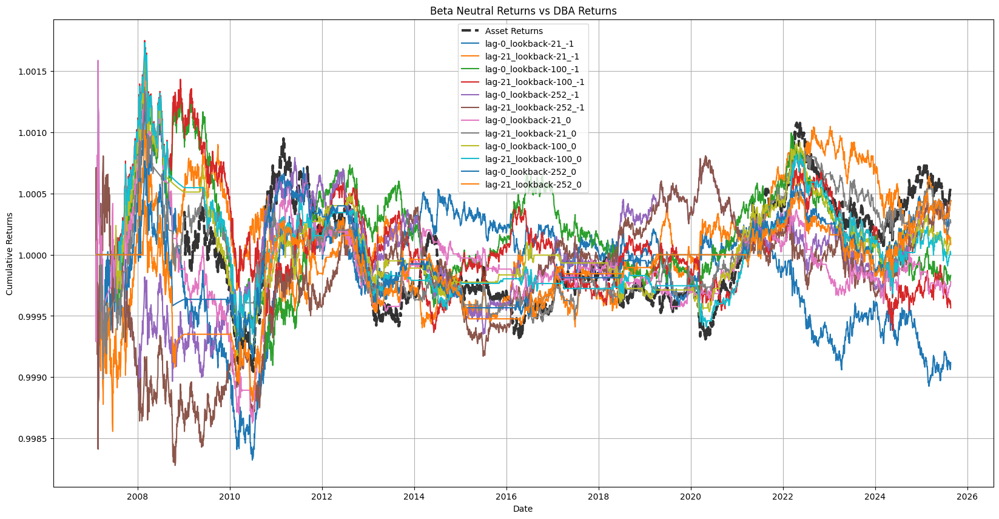

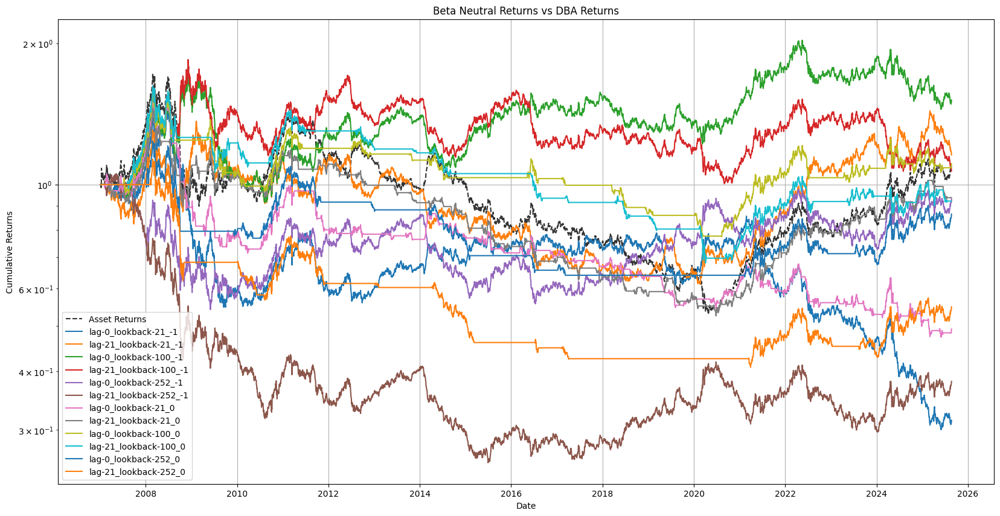

In [ ]:
def get_momentum_signal(df, lookback_period, lag_period, pos_signal=1, neg_signal=-1):
    df = df[['close']].copy()
    df['returns'] = df['close'].pct_change()

    # Calculate rolling returns and lagged returns
    df['rolling_returns'] = df['close'].rolling(lookback_period).apply(lambda x: x[-1] / x[0] - 1, raw=True)
    df['lagged_returns'] = df['rolling_returns'].shift(lag_period)
    
    # Generate signal based on lagged returns
    df['signal'] = np.where(df['lagged_returns'] > 0, pos_signal, neg_signal)
    df['signal'] = df['signal'].shift(1)  # Shift to avoid lookahead bias
    df['signal'] = df['signal'].fillna(0)  # Fill NaN values with 0
    return df['signal']


def get_momentum_returns(df, lookback_period, lag_period, pos_signal=1, neg_signal=-1, rebalance_period=21, interest_rate=0.03):
    df = df.copy()
    df['market_returns'] = df['close'].pct_change()
    signal = get_momentum_signal(
        df=df,
        lookback_period=lookback_period,
        lag_period=lag_period,
        pos_signal=pos_signal,
        neg_signal=neg_signal
    )

    # Calculate risk asset position based on the signal and rebalance period
    position = 0.0
    position_list = []
    day = 0
    df['signal'] = signal
    for i, r in df.iterrows():
        if day % rebalance_period == 0:
            position = r['signal']
        position_list.append(position)
        day += 1
    df['position'] = position_list

    # Calculate strategy returns
    df[f'strategy_returns'] = (
        df['market_returns'] * df['position']
        + ((1 + interest_rate) ** (1 / 252) - 1) * (0.0 - df['position'])
    )
    df['strategy_returns'] = df['strategy_returns'].fillna(0.0)  # Fill NaN values with 0

    return df['strategy_returns']





ticker = 'DBA'
plt.figure(figsize=(20, 10))
port_perf = []
for neg_signal in [-1, 0]:
    for lookback_period in LOOKBACK_PERIODS:
        for lag_period in LAG_PERIODS:
            returns = get_momentum_returns(df=price_data[ticker], lookback_period=lookback_period, lag_period=lag_period, neg_signal=neg_signal)
            
            port_perf.append([
                f"lag-{lag_period}_lookback-{lookback_period}_{neg_signal}",
                returns
            ])

min_len = min([len(x[1]) for x in port_perf])
df = price_data[ticker].copy()
df = df.iloc[-min_len:]
df['market_returns'] = df['close'].pct_change().fillna(0.0)
for label, returns in port_perf:
    returns = returns[-min_len:]
    df[label] = returns
    # df[f'{label}_rolling'] = (df[label] + 1).rolling(252)
plt.plot(df.index, (df['market_returns'] + 1).rolling(252 * 2).mean(), label='Asset Returns', color='black', linewidth=3, linestyle='--', alpha=0.8)
for label, returns in port_perf:
    plt.plot(df.index, (df[label] + 1).rolling(252 * 2, min_periods=21).mean(), label=label)

plt.title(f'Beta Neutral Returns vs {ticker} Returns')
plt.xlabel('Date')
plt.ylabel('Cumulative Returns')
plt.legend()
plt.grid()
plt.show()




plt.figure(figsize=(20, 10))
min_len = min([len(x[1]) for x in port_perf])
df = price_data[ticker].copy()
df = df.iloc[-min_len:]
df['market_returns'] = df['close'].pct_change().fillna(0.0)
# df['blend_returns']
for label, returns in port_perf:
    returns = returns[-min_len:]
    df[label] = returns
plt.plot(df.index, (df['market_returns'] + 1).cumprod(), label='Asset Returns', color='black', linewidth=1.5, linestyle='--', alpha=0.8)
for label, returns in port_perf:
    plt.plot(df.index, (df[label] + 1).cumprod(), label=label)
plt.yscale('log')
plt.title(f'Beta Neutral Returns vs {ticker} Returns')
plt.xlabel('Date')
plt.ylabel('Cumulative Returns')
plt.legend()
plt.grid()
plt.show()

## Optimization

In [ ]:
def get_optimized_signal(
        df, 
        obs_period=252, 
        obs_weight=0.5, 
        rebalance_period=21, 
        interest_rate=0.03, 
        pos_signal_list=[1], 
        neg_signal_list=[-1, 0],
        top_k=3,
        weight=''
    ):
    df = df.copy()
    df['market_returns'] = df['close'].pct_change()

    for pos


SyntaxError: invalid syntax (3432147185.py, line 15)

In [ ]:
def calculate_beta_neutral_positions(df, signal, rebalance_period=21, interest_rate=0.03):
    df = df.copy()
    df['market_returns'] = df['close'].pct_change()
    df['strategy_returns'] = returns_from_signal(df, signal, rebalance_period, interest_rate)

    # Calculate beta
    X = df['market_returns'].fillna(0.0)
    y = df['strategy_returns'].fillna(0.0)

    # Add constant to X for intercept (alpha)
    X = sm.add_constant(X)

    # Fit OLS regression
    model = sm.OLS(y, X).fit()

    beta = model.params['market_returns']
    
    # Calculate beta neutral risk position and returns
    beta_neutral_signal = signal - beta    
    return beta_neutral_signal


def calculate_beta_neutral_returns(df, signal, rebalance_period=21, interest_rate=0.03):
    df = df.copy()
    beta_neutral_signal = calculate_beta_neutral_positions(df, signal, rebalance_period, interest_rate)
    df['beta_neutral_returns'] = returns_from_signal(df, beta_neutral_signal, rebalance_period, interest_rate)
    return df['beta_neutral_returns']

## Test optimization

In [ ]:
def calc_ret(arr):
    ret = np.prod(arr + 1) ** (252 / len(arr)) - 1
    return ret

def calc_sr(arr):
    ret = np.prod(arr + 1) ** (252 / len(arr)) - 1
    vol = np.std(arr) * np.sqrt(252 / len(arr))
    return ret / vol

def returns_with_optimization(ticker, optim_factor='ret', rebalance_period=21, interest_rate=0.03):
    df = price_data[ticker].copy()
    min_days = 0

    df_perf_overall = pd.DataFrame()
    for lookback_period in LOOKBACK_PERIODS:
        for lag_period in LAG_PERIODS:
            signal = get_momentum_signal_prior_returns(df, lookback_period, lag_period)
            # beta_neutral_returns = calculate_beta_neutral_returns(df, signal, rebalance_period, interest_rate)
            # beta_neutral_signal = calculate_beta_neutral_positions(df, signal, rebalance_period, interest_rate)

            beta_neutral_returns = returns_from_signal(df, signal, rebalance_period=21, interest_rate=0.03)
            beta_neutral_signal = signal
            
            
            df_perf_overall[f'lookback{lookback_period}_lag{lag_period}_exp_ret'] = beta_neutral_returns.expanding().apply(calc_ret)
            df_perf_overall[f'lookback{lookback_period}_lag{lag_period}_exp_sr'] = beta_neutral_returns.expanding().apply(calc_sr)
            df_perf_overall[f'lookback{lookback_period}_lag{lag_period}_rol_ret'] = beta_neutral_returns.rolling(252 * 2, min_periods=1).apply(calc_ret)
            df_perf_overall[f'lookback{lookback_period}_lag{lag_period}_rol_sr'] = beta_neutral_returns.rolling(252 * 2, min_periods=1).apply(calc_sr)
            df_perf_overall[f'lookback{lookback_period}_lag{lag_period}_signal'] = beta_neutral_signal
    
    
    days = 0
    position = 0.0
    positions = []
    lag_tracker = []
    lookback_tracker = []
    best_lag, best_lookback = 0, 0
    for i, r in tqdm(df.iterrows(), total=df.shape[0]):
        if days < min_days:
            pass
            
        else:
            if days % rebalance_period == 0:
                # Evaluate weighting based on optimization method
                
                # Cut off date
                date = i
                df_window = df_perf_overall.loc[:date].copy()
                
                
                # Compute prior performance
                df_perf = {
                    'lookback_period': [],
                    'lag_period': [],
                    'weight_exp': [],
                    'weight_rol': [],
                    'signal': [],
                }
                for lookback_period in LOOKBACK_PERIODS:
                    for lag_period in LAG_PERIODS:
                        df_perf['lookback_period'].append(lookback_period)
                        df_perf['lag_period'].append(lag_period)
                        df_perf['signal'].append(df_window.iloc[-1][f'lookback{lookback_period}_lag{lag_period}_signal'])
                        weight_exp = df_window.iloc[-1][f'lookback{lookback_period}_lag{lag_period}_exp_{optim_factor}']
                        weight_rol = df_window.iloc[-1][f'lookback{lookback_period}_lag{lag_period}_rol_{optim_factor}']
                        
                        df_perf['weight_exp'].append(weight_exp)
                        df_perf['weight_rol'].append(weight_rol)
                
                df_perf = pd.DataFrame(df_perf)
                df_perf['weights'] = 1e-3
                df_perf['weights'] = (df_perf['weight_exp'] * 0.0 + df_perf['weight_rol'] * 1.0)
                df_perf['weights'] = df_perf['weights'].fillna(1e-3)
                df_perf['weights'] = df_perf['weights'] / df_perf['weights'].abs().sum()
                position = (df_perf['signal'] * df_perf['weights']).sum()
                # if abs(position) > 2:
                # display(df_perf)
                # break
        positions.append(position)
        lag_tracker.append(best_lag)
        lookback_tracker.append(best_lookback)
        days += 1
        # if days > 1000 == 0:
        

    df['position'] = positions
    df['strategy_returns'] = returns_from_signal(df, df['position'], rebalance_period, interest_rate)
    df['market_returns'] = df['close'].pct_change().fillna(0.0)
    df['best_lag'] = lag_tracker
    df['best_lookback'] = lookback_tracker
    df = df.iloc[min_days:]
    display(df)

    return df[['strategy_returns', 'market_returns', 'position', 'best_lag', 'best_lookback']]



    

            

  0%|          | 0/4869 [00:00<?, ?it/s]

,open,high,low,close,adjclose,volume,dividends,stock_splits,capital_gains,position,strategy_returns,market_returns,best_lag,best_lookback
Date,,,,,,,,,,,,,,
2006-04-10,546.000000,548.000000,541.359985,544.159973,544.159973,484738,0.0,0.0,0.0,0.000000,0.000000,0.000000,0,0
2006-04-11,546.559998,547.119995,538.400024,545.599976,545.599976,162138,0.0,0.0,0.0,0.000000,0.000000,0.002646,0,0
2006-04-12,545.760010,550.479980,542.479980,542.719971,542.719971,156038,0.0,0.0,0.0,0.000000,0.000000,-0.005279,0,0
2006-04-13,540.000000,551.919983,539.200012,550.559998,550.559998,70088,0.0,0.0,0.0,0.000000,0.000000,0.014446,0,0
2006-04-17,553.599976,559.200012,549.440002,558.320007,558.320007,114713,0.0,0.0,0.0,0.000000,0.000000,0.014095,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-08-11,73.940002,74.230003,73.360001,73.800003,73.800003,3307600,0.0,0.0,0.0,-0.757368,-0.005077,0.006821,0,0
2025-08-12,73.220001,73.580002,72.800003,72.949997,72.949997,2929300,0.0,0.0,0.0,-0.757368,0.008812,-0.011518,0,0
2025-08-13,72.779999,72.830002,71.559998,72.459999,72.459999,5653500,0.0,0.0,0.0,-0.757368,0.005176,-0.006717,0,0


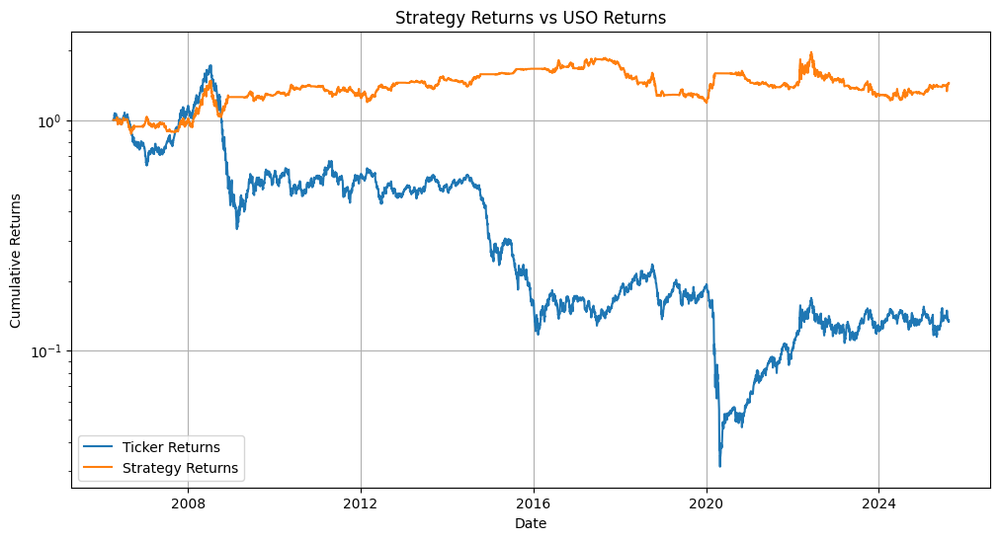

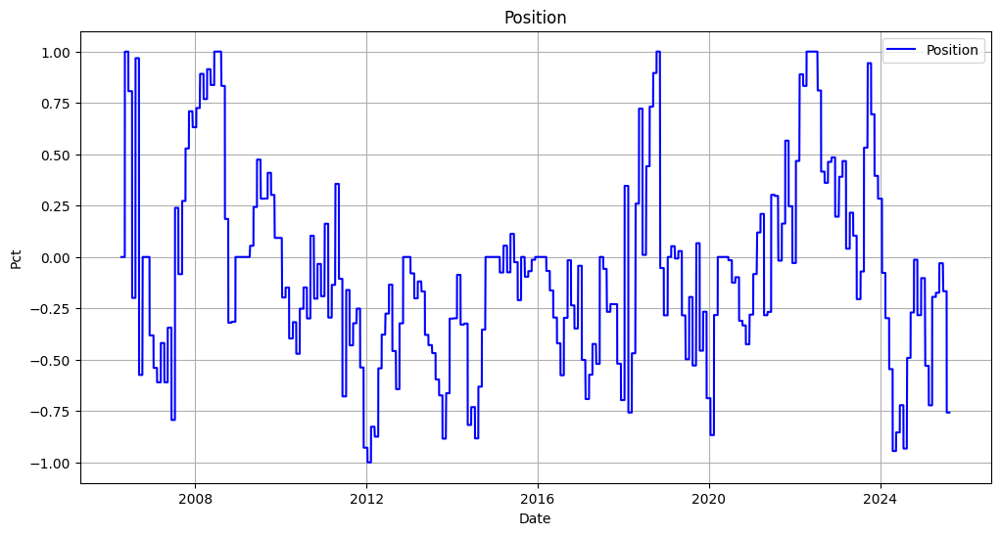

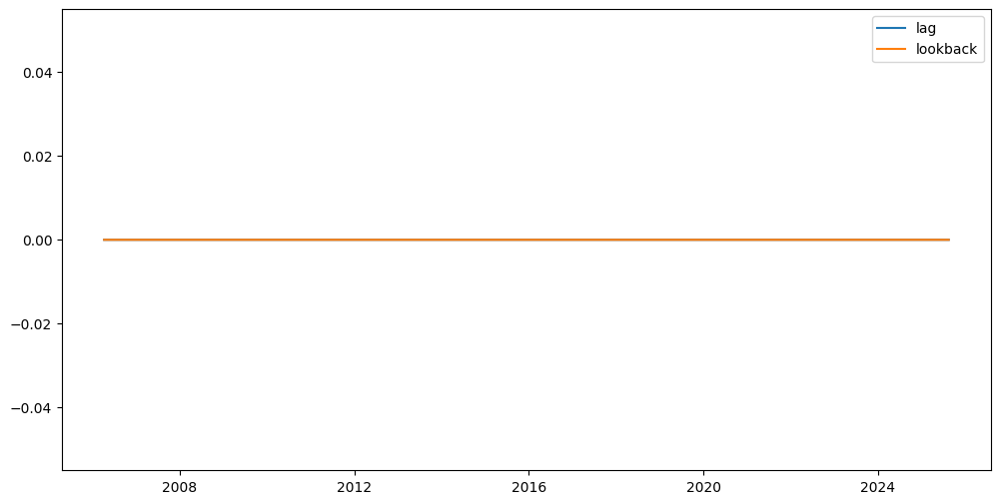

In [ ]:
ticker = 'USO'
df_returns = returns_with_optimization(ticker, optim_factor='sr', rebalance_period=21, interest_rate=0.03)
plt.figure(figsize=(12, 6))
plt.plot(df_returns.index, (df_returns['market_returns'] + 1).cumprod(), label='Ticker Returns')
plt.plot(df_returns.index, (df_returns['strategy_returns'] + 1).cumprod(), label='Strategy Returns')

plt.title(f'Strategy Returns vs {ticker} Returns')
plt.xlabel('Date')
plt.ylabel('Cumulative Returns')
plt.yscale('log')
plt.legend()
plt.grid()
plt.show()
plt.figure(figsize=(12, 6))
plt.plot(df_returns.index, df_returns['position'], label='Position', color='blue')
plt.title(f'Position')
plt.xlabel('Date')
plt.ylabel('Pct')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(df_returns.index, df_returns['best_lag'], label='lag')
plt.plot(df_returns.index, df_returns['best_lookback'], label='lookback')
plt.legend()
plt.show()


  0%|          | 0/8193 [00:00<?, ?it/s]

,open,high,low,close,adjclose,volume,dividends,stock_splits,capital_gains,position,strategy_returns,market_returns,best_lag,best_lookback
Date,,,,,,,,,,,,,,
1993-01-29,43.968750,43.968750,43.750000,43.937500,24.380432,1003200,0.0,0.0,0.0,0.0,0.000000,0.000000,0,0
1993-02-01,43.968750,44.250000,43.968750,44.250000,24.553856,480500,0.0,0.0,0.0,0.0,0.000000,0.007112,0,0
1993-02-02,44.218750,44.375000,44.125000,44.343750,24.605873,201300,0.0,0.0,0.0,0.0,0.000000,0.002119,0,0
1993-02-03,44.406250,44.843750,44.375000,44.812500,24.865974,529400,0.0,0.0,0.0,0.0,0.000000,0.010571,0,0
1993-02-04,44.968750,45.093750,44.468750,45.000000,24.970011,531500,0.0,0.0,0.0,0.0,0.000000,0.004184,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-08-11,637.460022,638.950012,634.659973,635.919983,635.919983,58742300,0.0,0.0,0.0,1.0,-0.002095,-0.001977,0,0
2025-08-12,638.289978,642.849976,636.789978,642.690002,642.690002,64730800,0.0,0.0,0.0,1.0,0.010529,0.010646,0,0
2025-08-13,644.909973,646.190002,642.679993,644.890015,644.890015,60092800,0.0,0.0,0.0,1.0,0.003306,0.003423,0,0


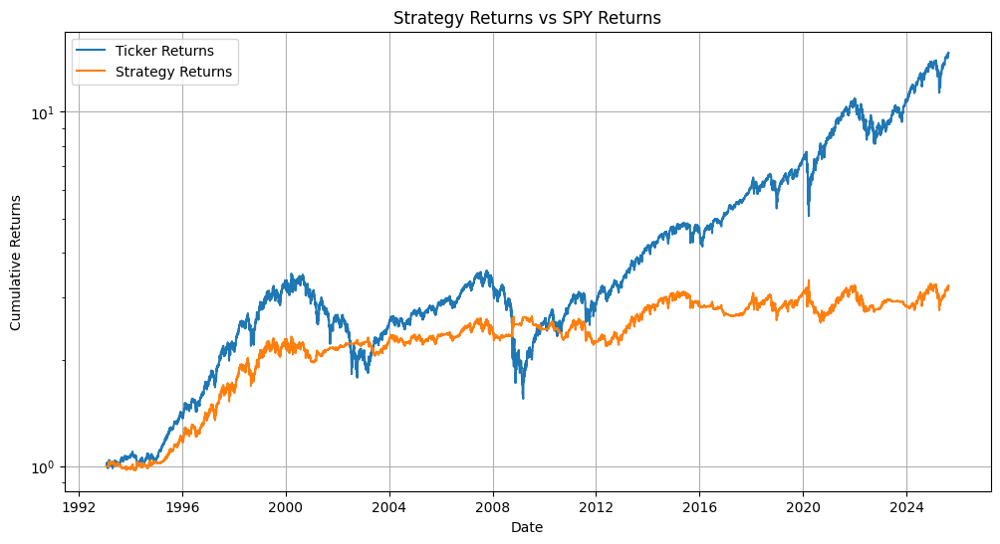

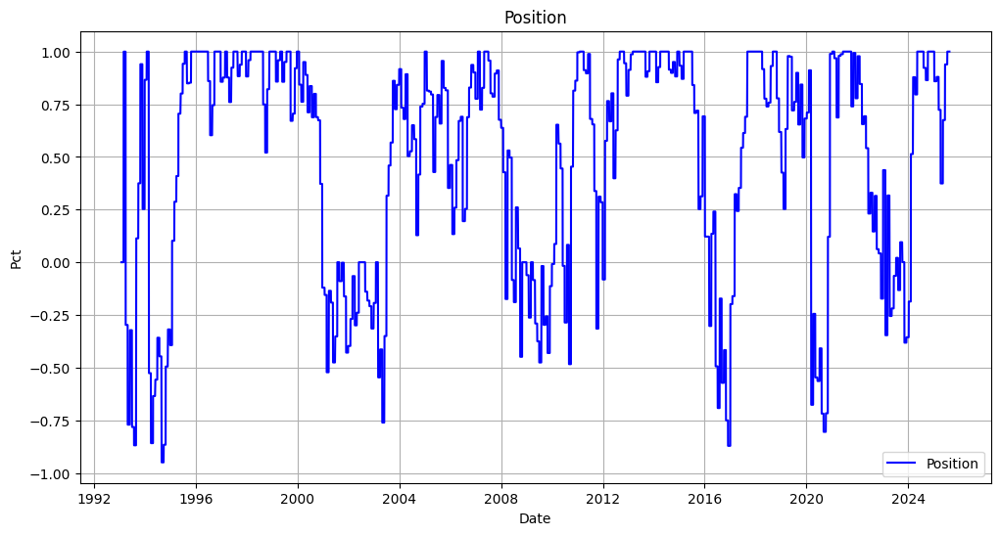

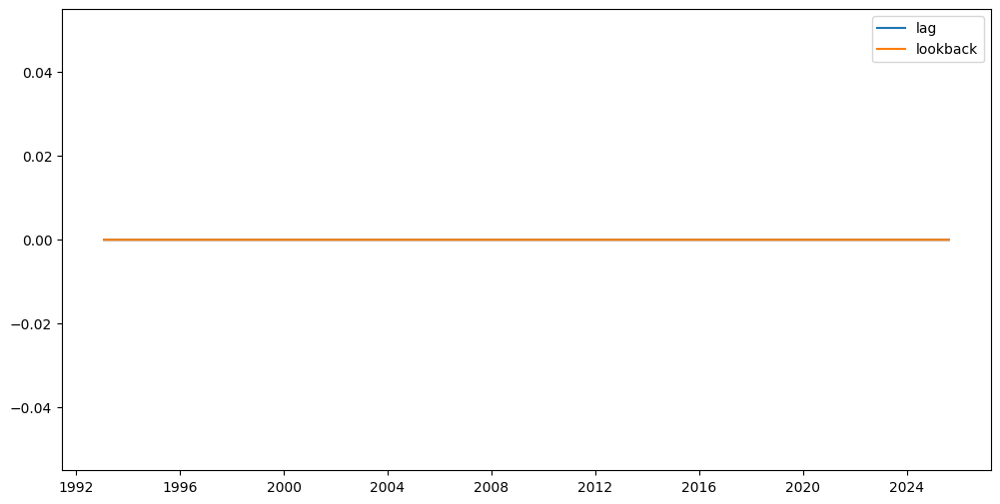

In [ ]:
ticker = 'SPY'
df_returns = returns_with_optimization(ticker, optim_factor='sr', rebalance_period=21, interest_rate=0.03)
plt.figure(figsize=(12, 6))
plt.plot(df_returns.index, (df_returns['market_returns'] + 1).cumprod(), label='Ticker Returns')
plt.plot(df_returns.index, (df_returns['strategy_returns'] + 1).cumprod(), label='Strategy Returns')

plt.title(f'Strategy Returns vs {ticker} Returns')
plt.xlabel('Date')
plt.ylabel('Cumulative Returns')
plt.yscale('log')
plt.legend()
plt.grid()
plt.show()
plt.figure(figsize=(12, 6))
plt.plot(df_returns.index, df_returns['position'], label='Position', color='blue')
plt.title(f'Position')
plt.xlabel('Date')
plt.ylabel('Pct')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(df_returns.index, df_returns['best_lag'], label='lag')
plt.plot(df_returns.index, df_returns['best_lookback'], label='lookback')
plt.legend()
plt.show()


  0%|          | 0/5800 [00:00<?, ?it/s]

,open,high,low,close,adjclose,volume,dividends,stock_splits,capital_gains,position,strategy_returns,market_returns,best_lag,best_lookback
Date,,,,,,,,,,,,,,
2002-07-30,81.750000,81.900002,81.519997,81.519997,37.326046,6100,0.0,0.0,0.0,0.000000,0.000000,0.000000,0,0
2002-07-31,81.949997,82.800003,81.900002,82.529999,37.788502,29400,0.0,0.0,0.0,0.000000,0.000000,0.012390,0,0
2002-08-01,82.540001,83.019997,82.540001,83.000000,38.003716,25000,0.0,0.0,0.0,0.000000,0.000000,0.005695,0,0
2002-08-02,83.160004,84.099998,82.879997,83.849998,38.392891,52800,0.0,0.0,0.0,0.000000,0.000000,0.010241,0,0
2002-08-05,84.040001,84.440002,83.849998,84.220001,38.562283,61100,0.0,0.0,0.0,0.000000,0.000000,0.004413,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-08-11,87.540001,87.669998,87.279999,87.389999,87.389999,20100900,0.0,0.0,0.0,0.000000,0.000000,0.001146,0,0
2025-08-12,86.900002,86.970001,86.550003,86.949997,86.949997,41052300,0.0,0.0,0.0,-0.112552,0.000580,-0.005035,0,0
2025-08-13,87.440002,87.809998,87.430000,87.669998,87.669998,30817500,0.0,0.0,0.0,-0.112552,-0.000919,0.008281,0,0


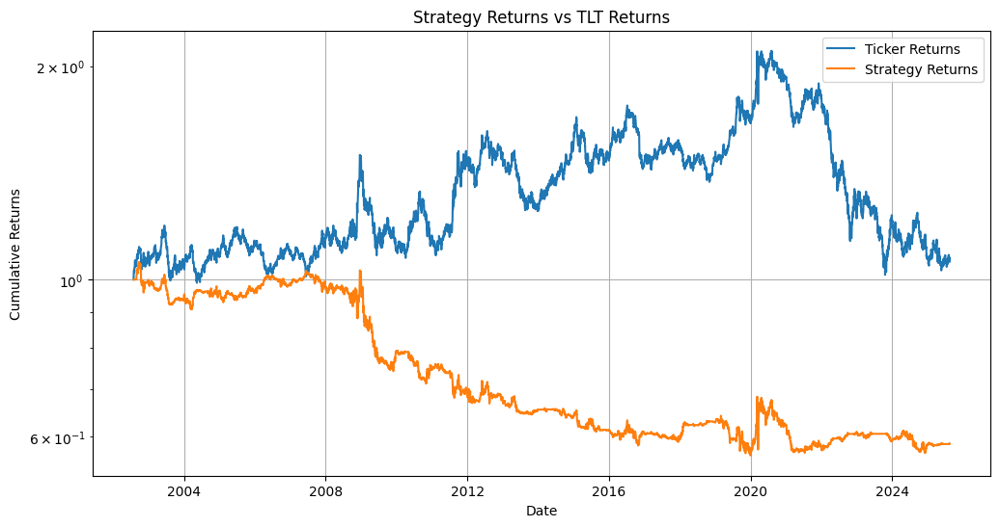

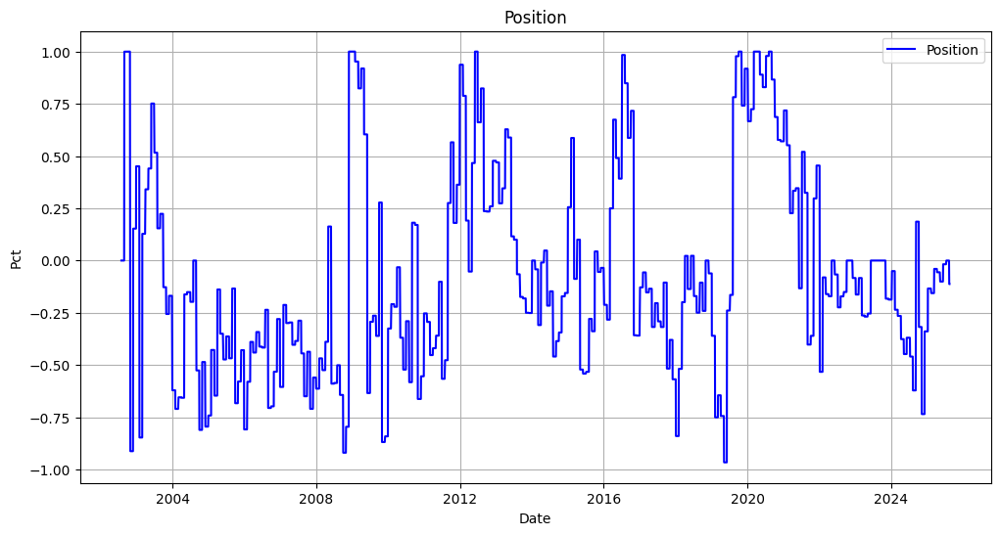

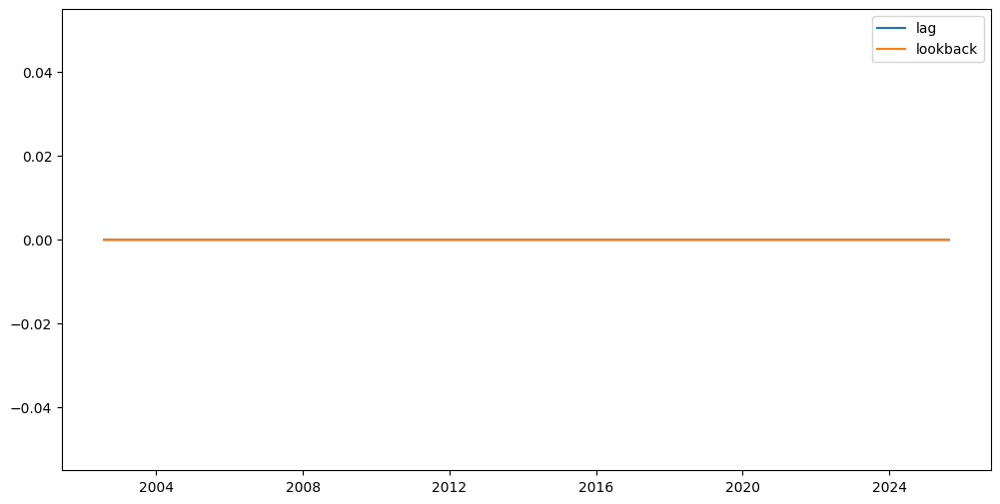

In [ ]:
ticker = 'TLT'
df_returns = returns_with_optimization(ticker, optim_factor='sr', rebalance_period=21, interest_rate=0.03)
plt.figure(figsize=(12, 6))
plt.plot(df_returns.index, (df_returns['market_returns'] + 1).cumprod(), label='Ticker Returns')
plt.plot(df_returns.index, (df_returns['strategy_returns'] + 1).cumprod(), label='Strategy Returns')

plt.title(f'Strategy Returns vs {ticker} Returns')
plt.xlabel('Date')
plt.ylabel('Cumulative Returns')
plt.yscale('log')
plt.legend()
plt.grid()
plt.show()
plt.figure(figsize=(12, 6))
plt.plot(df_returns.index, df_returns['position'], label='Position', color='blue')
plt.title(f'Position')
plt.xlabel('Date')
plt.ylabel('Pct')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(df_returns.index, df_returns['best_lag'], label='lag')
plt.plot(df_returns.index, df_returns['best_lookback'], label='lookback')
plt.legend()
plt.show()



  0%|          | 0/5218 [00:00<?, ?it/s]

,open,high,low,close,adjclose,volume,dividends,stock_splits,capital_gains,position,strategy_returns,market_returns,best_lag,best_lookback
Date,,,,,,,,,,,,,,
2004-11-18,44.430000,44.490002,44.070000,44.380001,44.380001,5992000,0.0,0.0,0.0,0.0,0.000000,0.000000,0,0
2004-11-19,44.490002,44.919998,44.470001,44.779999,44.779999,11655300,0.0,0.0,0.0,0.0,0.000000,0.009013,0,0
2004-11-22,44.750000,44.970001,44.740002,44.950001,44.950001,11996000,0.0,0.0,0.0,0.0,0.000000,0.003796,0,0
2004-11-23,44.880001,44.919998,44.720001,44.750000,44.750000,3169200,0.0,0.0,0.0,0.0,0.000000,-0.004449,0,0
2004-11-24,44.930000,45.049999,44.790001,45.049999,45.049999,6105100,0.0,0.0,0.0,0.0,0.000000,0.006704,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-08-11,308.619995,309.660004,307.630005,308.549988,308.549988,10326700,0.0,0.0,0.0,1.0,-0.014492,-0.014375,0,0
2025-08-12,308.220001,309.309998,306.709991,308.269989,308.269989,9697400,0.0,0.0,0.0,1.0,-0.001025,-0.000907,0,0
2025-08-13,309.100006,310.390015,308.450012,309.209991,309.209991,4718600,0.0,0.0,0.0,1.0,0.002932,0.003049,0,0


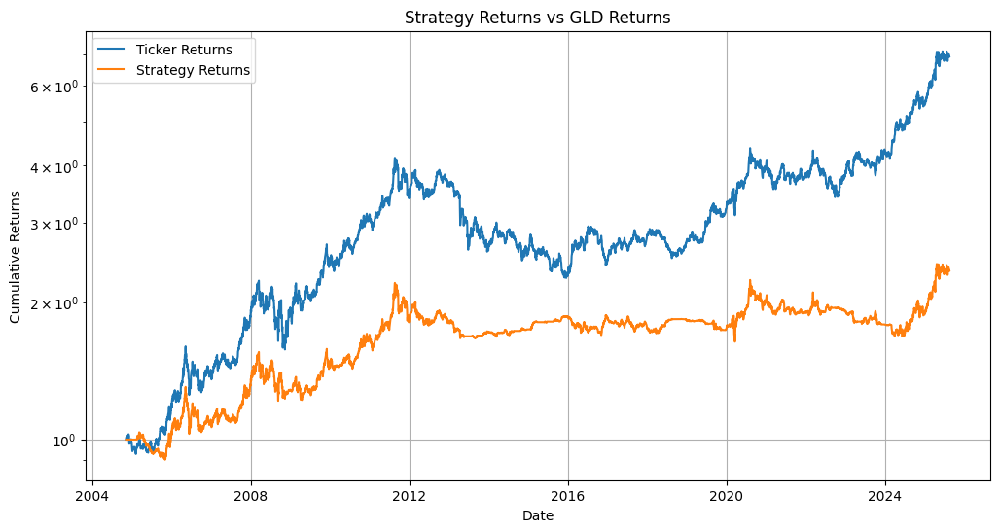

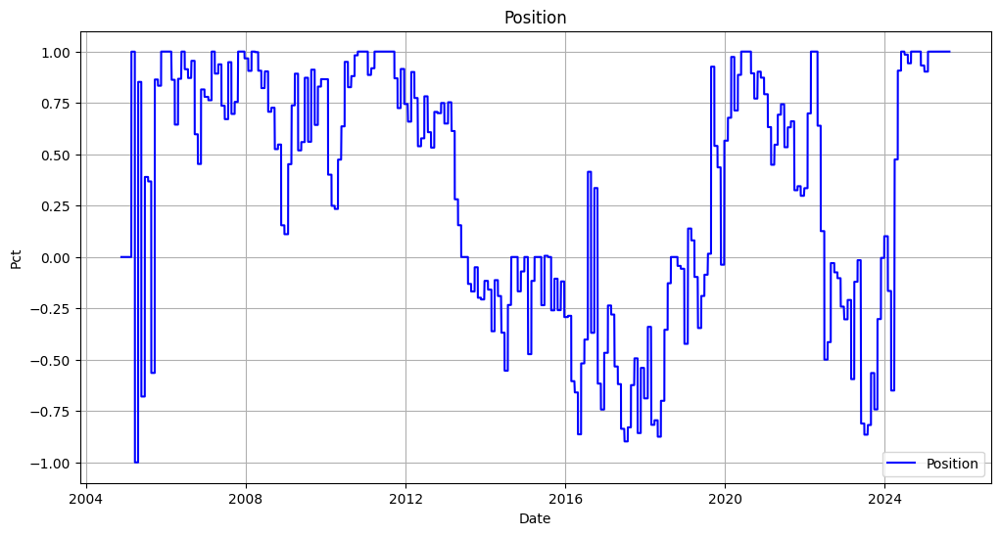

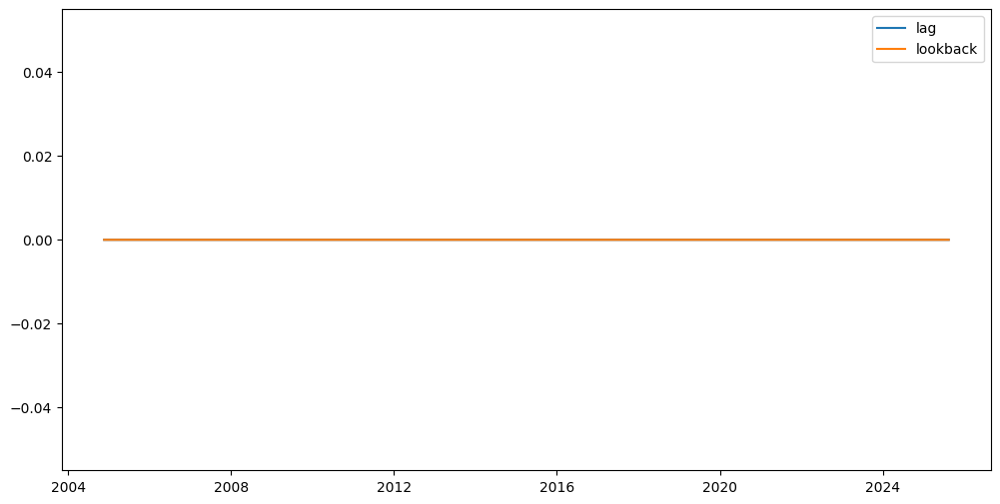

In [ ]:
ticker = 'GLD'
df_returns = returns_with_optimization(ticker, optim_factor='sr', rebalance_period=21, interest_rate=0.03)
plt.figure(figsize=(12, 6))
plt.plot(df_returns.index, (df_returns['market_returns'] + 1).cumprod(), label='Ticker Returns')
plt.plot(df_returns.index, (df_returns['strategy_returns'] + 1).cumprod(), label='Strategy Returns')

plt.title(f'Strategy Returns vs {ticker} Returns')
plt.xlabel('Date')
plt.ylabel('Cumulative Returns')
plt.yscale('log')
plt.legend()
plt.grid()
plt.show()
plt.figure(figsize=(12, 6))
plt.plot(df_returns.index, df_returns['position'], label='Position', color='blue')
plt.title(f'Position')
plt.xlabel('Date')
plt.ylabel('Pct')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(df_returns.index, df_returns['best_lag'], label='lag')
plt.plot(df_returns.index, df_returns['best_lookback'], label='lookback')
plt.legend()
plt.show()


### Generate indicators

In [ ]:
ticker_list = ['DBA', 'USO', 'SPY', 'TLT', 'GLD', 'PPLT', 'DBB']

risky_assets = dict()
for ticker in ticker_list:
    risky_assets[ticker] = dict()
    risky_assets[ticker]['data'] = price_data[ticker].copy()


## Define Strategy

In [ ]:

def allocation_func(
    ticker_list, 
    lookback_periods,
    lag_periods, 
    historical_period, 
    current_date,
    dict_data,
    covariance_matrix_lookback,
    verbose=False
):
    #################################################################
    # Correlation Optimization
    # Use HRP to optimize for correlation between assets
    # skip if we only have one ticker
    #################################################################
    if len(ticker_list) > 1:
        df_combined = pd.DataFrame()
        for ticker in ticker_list:
            if ticker in ['UPRO', 'TMF']: continue
            df_data = dict_data[ticker].copy()
            df_data = df_data[df_data.index <= current_date].copy()
            df_data = df_data.iloc[-historical_period:]
            df_data['returns'] = df_data['close'].pct_change()
            df_combined[ticker] = df_data['returns']
        df_combined.dropna(inplace=True)

        # Covariance Matrix with Exponentially Weighted Moving Average
        ewma_cov = risk_models.exp_cov(df_combined, returns_data=True, span=covariance_matrix_lookback)
        
        # Convariance Matrix with Ledoit Wolf shrinkage
        ledoit_wolf_cov = risk_models.CovarianceShrinkage(
            prices=df_combined.iloc[-covariance_matrix_lookback:], 
            returns_data=True
        ).ledoit_wolf()

        # Final Covariance Matrix is mean of EWMA and Ledoit Wolf
        cov = (ledoit_wolf_cov + ewma_cov) / 2

        # HRP to generate asset allocation weights
        hrpopt = HRPOpt(
            cov_matrix=cov
        )
        asset_allocation_weights = hrpopt.optimize()

            
    else:
        # Single asset case
        asset_allocation_weights = {ticker_list[0]: 1}
    

    ##################################################################
    # Momentum Optimization
    ##################################################################
    print(f'Current Date: {current_date}')
    momentum_weights = {}
    for ticker in ticker_list:
        df_data = dict_data[ticker].copy()
        df_data = df_data[df_data.index < current_date].copy()

        final_signal = get_composite_signal(df_data, lookback_periods=[21, 100, 252], lag_periods=[0, 10, 21], rebalance_period=21, historical_period=None, interest_rate=0.03)
        # create composite weight
        
        momentum_weights[ticker] = final_signal
        




        
        
        

    #################################################################
    # Combination of all optimizations
    #################################################################
    final_weights = {}
    for ticker in ticker_list:
        if ticker in ['UPRO', 'TMF']: continue
        final_weights[ticker] = (
            asset_allocation_weights[ticker]
            * momentum_weights[ticker]
            # * volatility_weights[ticker]
            # * return_weights[ticker]
        )
    
    # # Limit weights to be between 5% and 50%
    # for ticker in ticker_list:
    #     if ticker in ['UPRO', 'TMF']: continue
    #     final_weights[ticker] = np.clip(final_weights[ticker], 0.05, 0.5)
    
    sum_weights = 0
    for ticker in final_weights:
        weight = np.abs(final_weights[ticker])
        sum_weights += weight
    final_weights = {ticker: final_weights[ticker] / sum_weights for ticker in final_weights}
    return final_weights
    




In [ ]:
from strategies.base import BaseStrategy

ret_model_perf_tracker = []
vol_model_perf_tracker = []
leverage_tracker = []

class MultiAssetStrategy(BaseStrategy):

    params = (
        ('rebalance_period', 21),
        ('lookback_periods', [21, 100, 200, 252]),
        ('lag_periods', [0, 10, 21]),
        ('dict_data', dict()),
        ('historical_period', 252*2),
        ('covariance_matrix_lookback', 252),
    )

    def __init__(self):
        super().__init__()

        # Track rebalance interval
        self.rebalance_day = 0

        self.dict_data = self.p.dict_data
        
        
    def next(self):
        super().next()
        if self.rebalance_day % self.p.rebalance_period == 0:
            self.rebalance()
            
        
        self.rebalance_day += 1


    def rebalance(self):
        current_capital = self.broker.getvalue()
        current_date = pd.to_datetime(self.datetime.date())

        

            
        
        # leverage_tracker.append(sum(asset_allocation_weights.values()))
        asset_allocation_weights = allocation_func(
            ticker_list=self.p.tickers, 
            lookback_periods=self.p.lookback_periods, 
            historical_period=self.p.historical_period,
            lag_periods=self.p.lag_periods,
            current_date=current_date,
            dict_data=self.p.dict_data,
            covariance_matrix_lookback=self.p.covariance_matrix_lookback,
        )
        leverage_tracker.append(sum(asset_allocation_weights.values()))
        for ticker in self.p.tickers:

            
            data = self.getdatabyname(ticker)
            current_position = self.broker.getposition(data).size
            ticker_capital = current_capital * asset_allocation_weights[ticker]
            
            target_position = ticker_capital / self.data.close[0]
            order_quantity = (target_position - current_position)
            # Submit order
            self._submit_order(ticker, order_quantity, self.data.close[0])




## Run Backtest

In [ ]:
tickers_in_backtest = [
    # 'SPY', 
    # 'TLT', 
    # 'GLD', 
    # 'PPLT', 
    # 'URA', 
    'DBA', 
    # 'EEM',
    # 'LQD', 
    # 'IBIT',
    # 'USO',
    # 'UPRO',
    # 'TMF',
]


ret_model_perf_tracker = []
vol_model_perf_tracker = []
leverage_tracker = []

# Price data
trading_price_data = {f: price_data[f].copy() for f in tickers_in_backtest}
start_date = pd.to_datetime('2008-01-01')
for ticker in trading_price_data:
    df = trading_price_data[ticker]
    df = df.loc[df.index >= start_date]
    trading_price_data[ticker] = df

# Trading data
trading_data = dict()
for ticker in tickers_in_backtest:
    trading_data[ticker] = risky_assets[ticker]['data']


btr = BackTester(trading_price_data)
btr.add_strategy(
    MultiAssetStrategy,
    tickers=tickers_in_backtest,
    price_data=trading_price_data,
    rebalance_period=REBALANCE_PERIOD,
    lookback_periods=LOOKBACK_PERIODS,
    dict_data=trading_data.copy(),
    covariance_matrix_lookback=COVAR_LOOKBACK_PERIOD,
    historical_period=HISTORY_LOOKBACK_PERIOD,
    lag_periods=LAG_PERIODS,
)
results = btr.backtest()



# plt.figure(figsize=(20, 4))
# plt.plot(leverage_tracker, label='Leverage')
# plt.show()




Current Date: 2008-01-02 00:00:00


c:\Users\alexr\miniconda3\envs\ai2\Lib\site-packages\backtrader\cerebro.py:670: SyntaxWarning: invalid escape sequence '\*'
  '''Adds a callback to get messages which would be handled by the
c:\Users\alexr\miniconda3\envs\ai2\Lib\site-packages\backtrader\cerebro.py:712: SyntaxWarning: invalid escape sequence '\*'
  '''Adds a callback to get messages which would be handled by the


NameError: name 'get_composite_signal' is not defined

cagr: -0.02
volatility: 0.17
sharpe: -0.12
max_drawdown: 0.52
cumulative_returns: -0.30
Mean leverage: -0.14


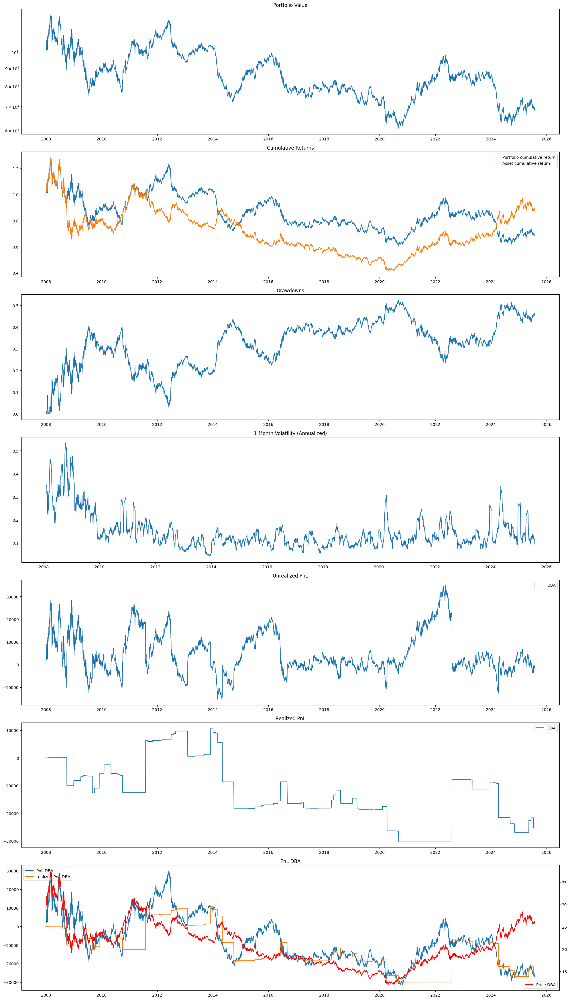

In [ ]:
for key in results:
    if key == 'returns': continue
    print(f"{key}: {results[key]:.2f}")

print(f'Mean leverage: {np.mean(leverage_tracker):.2f}')



btr.plot_results()

## END

# LIVE TRADING

## Calculate Positions

In [ ]:
capital = 78616
leverage = 1.0
capital_spent = 0
fixed_port_allocation = 0.4
ml_port_allocation = 0.4
leveraged_port_allocation = 0.2


ticker_list = [
    'SPY', 
    'TLT', 
    'GLD', 
    'EEM',
    'LQD', 
]

##########################################################
# FIXED PORTFOLIO
##########################################################

trading_data = {f: risky_assets[f]['data'] for f in ticker_list}
fixed_port_weights = {
    ticker: (1 / len(ticker_list)) * fixed_port_allocation for ticker in ticker_list
}

##########################################################
# ML PORTFOLIO
##########################################################
ticker_list = [
    'SPY', 
    'TLT', 
    'GLD', 
    'EEM',
    'LQD',
    'IBIT',
]
trading_data = {f: risky_assets[f]['data'] for f in ticker_list}

asset_allocation_weights = allocation_func(
    ticker_list=ticker_list, 
    lookback_periods=LOOKBACK_PERIODS, 
    historical_period=HISTORY_LOOKBACK_PERIOD, 
    current_date=CURRENT_DATE,
    dict_data=trading_data,
    covariance_matrix_lookback=COVAR_LOOKBACK_PERIOD,
    verbose=True,
)

print(asset_allocation_weights)
ml_port_weights = {
    ticker: asset_allocation_weights[ticker] * ml_port_allocation for ticker in ticker_list
}
print(ml_port_weights)


##########################################################
# LEVERAGED PORT
##########################################################
df_data = risky_assets["SPY"]['data'].copy()

# Define features
X_features = []
for period in LOOKBACK_PERIODS:
    X_features.append(f'vol_{period}')
    X_features.append(f'r2_{period}')
    X_features.append(f'ATR_{period}')
if 'VIX' in df_data.columns:
    X_features.append('VIX')
df_train = df_data[X_features + ['vol_forward']].copy()

# drop na values
df_train = df_train.dropna()

# Scale features
X_scaler = RobustScaler()
df_train[X_features] = X_scaler.fit_transform(df_train[X_features])

# Split into train and test
X_train = df_train[X_features].iloc[:-1]
X_test =  df_data[X_features].iloc[-1:]
X_test = pd.DataFrame(X_test, columns=X_features)
X_test[X_features] = X_scaler.transform(X_test)


# y feature = vol forward
y_train = df_train['vol_forward'].iloc[:-1]
model = LinearRegression()
model.fit(X_train, y_train)
vol_forecast = model.predict(X_test)[0]

# Transform vol forecast to be between 0 and 1 as percentile of vol distribution
# Higher vol forecast = lower vol scaling factor
pct_rank = stats.percentileofscore(y_train, vol_forecast, kind='rank') / 100
vol_scaling_factor = (1 - pct_rank) * 1.0

leveraged_port_weights = {}
leveraged_port_weights["UPRO"] = vol_scaling_factor * leveraged_port_allocation * 0.7

######################################################################################################

df_data = risky_assets["TMF"]['data'].copy()

# Define features
X_features = []
for period in LOOKBACK_PERIODS:
    X_features.append(f'vol_{period}')
    X_features.append(f'r2_{period}')
    X_features.append(f'ATR_{period}')
if 'VIX' in df_data.columns:
    X_features.append('VIX')
df_train = df_data[X_features + ['vol_forward']].copy()

# drop na values
df_train = df_train.dropna()

# Scale features
X_scaler = RobustScaler()
df_train[X_features] = X_scaler.fit_transform(df_train[X_features])

# Split into train and test
X_train = df_train[X_features].iloc[:-1]
X_test =  df_data[X_features].iloc[-1:]
X_test = pd.DataFrame(X_test, columns=X_features)
X_test[X_features] = X_scaler.transform(X_test)


# y feature = vol forward
y_train = df_train['vol_forward'].iloc[:-1]
model = LinearRegression()
model.fit(X_train, y_train)
vol_forecast = model.predict(X_test)[0]

# Transform vol forecast to be between 0 and 1 as percentile of vol distribution
# Higher vol forecast = lower vol scaling factor
pct_rank = stats.percentileofscore(y_train, vol_forecast, kind='rank') / 100
vol_scaling_factor = (1 - pct_rank) * 1.0

leveraged_port_weights["TMF"] = vol_scaling_factor * leveraged_port_allocation * 0.3


##########################################################
# FINAL PORT
##########################################################
final_port_weights = {}
for ticker in ml_port_weights:
    final_port_weights[ticker] = fixed_port_weights.get(ticker, 0) + ml_port_weights[ticker]

for ticker in ['UPRO', 'TMF']:
    final_port_weights[ticker] = leveraged_port_weights[ticker]

for ticker in final_port_weights:
    print(f'{ticker}: {final_port_weights[ticker]:.2%}')
print(f"Total: {sum(final_port_weights.values()):.2%}")

trading_data = {f: risky_assets[f]['data'] for f in final_port_weights}
sum_of_factors = 0
for ticker in final_port_weights:
    print('------------------------------------------------------------------------')
    df_data = trading_data[ticker].copy()

    capital_allocated = capital * leverage * final_port_weights[ticker]
    current_price = df_data.iloc[-1]['close']
    shares_to_buy = int(capital_allocated / current_price)
    capital_to_buy = shares_to_buy * current_price
    capital_spent += capital_to_buy


    print(ticker)
    print(f'Current date:           {df_data.index[-1]}')
    print(f'Allocation:             {final_port_weights[ticker]:.2%}')
    print(f'Capital allocated:     ${capital_allocated:.2f}')
    print(f'shares to buy:          {shares_to_buy} = ${capital_allocated:.2f} / ${current_price:.2f}')

    






# ########################################################################
# # Momentum Portfolio
# ########################################################################
# tickers = [
#     'IBIT',
#     'URA', 
#     'PPLT',
#     'UUUU',
#     # 'MP',
#     # 'CPER', 
#     # 'UURAF', 
#     'ABAT', 
#     # 'TMC', 
#     # 'OPEN',
    
    
# ]
# for ticker in tickers:
#     df_data = risky_assets[ticker]['data'].copy()
#     high_breakout_indicator = 1 if df_data['close'].rolling(50).max().iloc[-1] == df_data['close'].rolling(10).max().iloc[-1] else 0
#     ma_indicator = 1 if df_data.iloc[-1]['MA_21'] < df_data['close'].rolling(10).mean().iloc[-1] else 0
#     assert ma_indicator * high_breakout_indicator == 1

#     print('------------------------------------------------------------------------')
#     capital_allocated = capital * leverage * momentum_portfolio_allocation * (1 / len(tickers))
#     current_price = df_data.iloc[-1]['close']
#     shares_to_buy = int(capital_allocated / current_price)
#     capital_to_buy = shares_to_buy * current_price
#     capital_spent += capital_to_buy

#     print(ticker)
#     print(f'Current date:           {df_data.index[-1]}')
#     print(f'Allocation:             {momentum_portfolio_allocation * (1 / len(tickers)):.2%}')
#     print(f'Capital allocated:     ${capital_allocated:.2f}')
#     print(f'shares to buy:          {shares_to_buy} = ${capital_allocated:.2f} / ${current_price:.2f}')






df_data = price_data['IB01.L'].copy()
print('------------------------------------------------------------------------')
capital_left = capital - capital_spent
cash_allocation = max(capital_left, 0)

print(f'IB01.L')
print(f'capital_left:           {capital_left:.2f} = {capital_left / capital:.2%}')
print(f'allocation:             {cash_allocation / capital:.2%}')
print(f'shares to buy:          {int(cash_allocation / df_data.iloc[-1]["close"]):.2f} = ${int(cash_allocation):.2f} / ${df_data.iloc[-1]["close"]:.2f}')
print('------------------------------------------------------------------------')

print(f'sum of factors: {sum_of_factors * leverage:.2%}')

-------------------------------------------------------
SPY 2025-06-25T00:00:00.000000000 2025-06-26T00:00:00.000000000
-------------------------------------------------------
TLT 2025-06-25T00:00:00.000000000 2025-06-26T00:00:00.000000000
-------------------------------------------------------
GLD 2025-06-25T00:00:00.000000000 2025-06-26T00:00:00.000000000
-------------------------------------------------------
EEM 2025-06-25T00:00:00.000000000 2025-06-26T00:00:00.000000000
-------------------------------------------------------
LQD 2025-06-25T00:00:00.000000000 2025-06-26T00:00:00.000000000
-------------------------------------------------------
IBIT 2025-06-25T00:00:00.000000000 2025-06-26T00:00:00.000000000
-------------------------------------------------------
SPY 2025-06-25T00:00:00.000000000 2025-06-26T00:00:00.000000000
-------------------------------------------------------
TLT 2025-06-25T00:00:00.000000000 2025-06-26T00:00:00.000000000
---------------------------------------

# PORTFOLIO TRACKING

In [ ]:
def compute_portfolio_value(trades_df, price_data_dict):
    """
    Compute daily portfolio value given trades and price data.
    
    trades_df: DataFrame with columns ['date', 'ticker', 'quantity', 'price', 'fees']
    price_data_dict: dict mapping ticker -> DataFrame with index 'date' and column 'close'
    
    Returns:
        portfolio_value: Series indexed by date
    """
    # Ensure date types and sort
    trades = trades_df.copy()
    trades['date'] = pd.to_datetime(trades['date'])
    trades.sort_values('date', inplace=True)

    # Determine date index range
    all_dates = pd.date_range(
        start=trades['date'].min(), 
        end=max(df.index.max() for df in price_data_dict.values()),
        freq='D'
    )
    
    # Initialize cash flow and holdings
    cash_flows = pd.Series(0.0, index=all_dates)
    holdings = {ticker: pd.Series(0.0, index=all_dates) for ticker in price_data_dict if ticker != 'CASH'}
    invested_capital = pd.Series(0.0, index=all_dates)
    
    # Process trades
    for _, row in trades.iterrows():
        dt = row['date']
        tk = row['ticker']
        qty = row['quantity']
        price = row['price']
        fees = row['fees']
        
        if tk == 'CASH':
            cash_flows.loc[dt] += qty
            invested_capital[dt:] += qty
        else:
            # Update holdings from this date onward
            holdings[tk].loc[dt:] += qty
            # Cash change: buying (positive qty) -> outflow; selling (negative qty) -> inflow
            cash_flows.loc[dt] += -qty * price - fees
    
    # Compute cumulative cash
    cash = cash_flows.cumsum()
    
    # Compute daily holdings value
    holdings_value = pd.Series(0.0, index=all_dates)
    for tk, pos in holdings.items():
        # Align prices
        # prices = price_data_dict[tk].reindex(all_dates)['close'].fillna(method='ffill')
        prices = price_data_dict[tk].reindex(all_dates)['close'].ffill()
        holdings_value += pos * prices
    
    # Total portfolio value
    portfolio_value = cash + holdings_value
    return portfolio_value, invested_capital

def compute_performance_metrics(portfolio_value, invested_capital, trading_days=252):
    """
    Compute performance metrics: CAGR, volatility, Sharpe ratio, max drawdown
    """
    cumulative_returns = portfolio_value / invested_capital

    # Daily returns
    daily_returns = cumulative_returns.pct_change().dropna()
    
    # CAGR
    total_days = (cumulative_returns.index[-1] - cumulative_returns.index[0]).days
    cagr = (cumulative_returns.iloc[-1] / cumulative_returns.iloc[0]) ** (trading_days / total_days) - 1
    
    # Volatility (annualized)
    vol = daily_returns.std() * np.sqrt(trading_days)
    
    # Sharpe ratio (assumes risk-free rate = 0)
    sharpe = cagr / vol
    
    # Max drawdown
    rolling_max = cumulative_returns.cummax()
    drawdown = (cumulative_returns - rolling_max) / rolling_max
    max_dd = drawdown.min()

    print(f'CAGR:                   {cagr:.2%}')
    print(f'Volatility:             {vol:.2%}')
    print(f'Sharpe Ratio:           {sharpe:.2f}')
    print(f'Max Drawdown:          -{-max_dd:.2%}')
    print(f'Total Returns:          {portfolio_value.iloc[-1] / invested_capital.iloc[-1] - 1:.2%}')
    print(f'Total PnL:             ${portfolio_value.iloc[-1] - invested_capital.iloc[-1]:.2f}')
    
    
    return {
        'CAGR': cagr,
        'Volatility': vol,
        'Sharpe Ratio': sharpe,
        'Max Drawdown': max_dd
    }

def plot_portfolio_and_drawdown(portfolio_value, invested_capital):
    """
    Plot portfolio value and drawdown
    """
    cumulative_returns = portfolio_value / invested_capital

    # Compute drawdown
    rolling_max = cumulative_returns.cummax()
    drawdown = (cumulative_returns - rolling_max) / rolling_max
    
    # Plot
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(10, 8))
    
    ax1.plot(cumulative_returns.index, cumulative_returns.values)
    ax1.set_title('Cumulative Returns Over Time')
    ax1.set_ylabel('Returns')
    
    ax2.plot(drawdown.index, drawdown.values)
    ax2.set_title('Drawdown Over Time')
    ax2.set_ylabel('Drawdown')
    ax2.set_xlabel('Date')
    plt.setp(ax2.get_xticklabels(), rotation=-20)
    
    plt.tight_layout()
    plt.show()

# Example usage:
trades_df = pd.read_excel('portfolio_tracker.xlsx')
# trades_df = trades_df.loc[trades_df['ticker'].isin(['SPY', 'TLT', 'GLD', 'SHV', 'CASH'])]
price_data_dict = {
    'SPY': pd.read_pickle(f'./data/raw/price/SPY_{CURRENT_DATE}.pkl'),
    'TLT': pd.read_pickle(f'./data/raw/price/TLT_{CURRENT_DATE}.pkl'),
    'GLD': pd.read_pickle(f'./data/raw/price/GLD_{CURRENT_DATE}.pkl'),
    'SHV': pd.read_pickle(f'./data/raw/price/SHV_{CURRENT_DATE}.pkl'),
    'PPLT': pd.read_pickle(f'./data/raw/price/PPLT_{CURRENT_DATE}.pkl'),
    'URA': pd.read_pickle(f'./data/raw/price/URA_{CURRENT_DATE}.pkl'),
    'USO': pd.read_pickle(f'./data/raw/price/USO_{CURRENT_DATE}.pkl'),
    'IBIT': pd.read_pickle(f'./data/raw/price/IBIT_{CURRENT_DATE}.pkl'),
    'EEM': pd.read_pickle(f'./data/raw/price/EEM_{CURRENT_DATE}.pkl'),
    'DBA': pd.read_pickle(f'./data/raw/price/DBA_{CURRENT_DATE}.pkl'),
    'IB01.L': pd.read_pickle(f'./data/raw/price/IB01.L_{CURRENT_DATE}.pkl'),
    'LQD': pd.read_pickle(f'./data/raw/price/LQD_{CURRENT_DATE}.pkl'),
    'CPER': pd.read_pickle(f'./data/raw/price/CPER_{CURRENT_DATE}.pkl'),
    'UUUU': pd.read_pickle(f'./data/raw/price/UUUU_{CURRENT_DATE}.pkl'),
    'ABAT': pd.read_pickle(f'./data/raw/price/ABAT_{CURRENT_DATE}.pkl'),
    'UPRO': pd.read_pickle(f'./data/raw/price/UPRO_{CURRENT_DATE}.pkl'),
    'TMF': pd.read_pickle(f'./data/raw/price/TMF_{CURRENT_DATE}.pkl'),

}
port_val, invested_cap = compute_portfolio_value(trades_df, price_data_dict)
metrics = compute_performance_metrics(port_val, invested_cap)
plot_portfolio_and_drawdown(port_val, invested_cap)
# for key in metrics:
#     print(f'{key}: {metrics[key]:.2f}')




CAGR:                   5.15%
Volatility:             7.11%
Sharpe Ratio:           0.73
Max Drawdown:          -3.21%
Total Returns:          2.37%
Total PnL:             $1791.51
